In [ ]:
import requests
from bs4 import BeautifulSoup as bts
import pandas as pd
import re
import numpy as np
import time
import pandas as pd
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
def getAndParseURL(url):
    result = requests.get(url, headers={"User-Agent":"Mozilla/5.0"}) # Safari/537.36. Chrome/103.0.0.0
    soup = bts(result.text, "html.parser")
    return soup

In [ ]:
pages = ["https://sofifa.com/players?showCol%5B0%5D=pi&showCol%5B1%5D=ae&showCol%5B2%5D=hi&showCol%5B3%5D=wi&showCol%5B4%5D=pf&showCol%5B5%5D=oa&showCol%5B6%5D=pt&showCol%5B7%5D=bo&showCol%5B8%5D=bp&showCol%5B9%5D=gu&showCol%5B10%5D=vl&showCol%5B11%5D=wg&showCol%5B12%5D=rc&showCol%5B13%5D=ta&showCol%5B14%5D=cr&showCol%5B15%5D=fi&showCol%5B16%5D=he&showCol%5B17%5D=sh&showCol%5B18%5D=vo&showCol%5B19%5D=ts&showCol%5B20%5D=dr&showCol%5B21%5D=cu&showCol%5B22%5D=fr&showCol%5B23%5D=lo&showCol%5B24%5D=bl&showCol%5B25%5D=to&showCol%5B26%5D=ac&showCol%5B27%5D=sp&showCol%5B28%5D=ag&showCol%5B29%5D=re&showCol%5B30%5D=ba&showCol%5B31%5D=tp&showCol%5B32%5D=so&showCol%5B33%5D=ju&showCol%5B34%5D=st&showCol%5B35%5D=sr&showCol%5B36%5D=ln&showCol%5B37%5D=te&showCol%5B38%5D=ar&showCol%5B39%5D=in&showCol%5B40%5D=po&showCol%5B41%5D=vi&showCol%5B42%5D=pe&showCol%5B43%5D=cm&showCol%5B44%5D=td&showCol%5B45%5D=ma&showCol%5B46%5D=sa&showCol%5B47%5D=sl&showCol%5B48%5D=tg&showCol%5B49%5D=gd&showCol%5B50%5D=gh&showCol%5B51%5D=gc&showCol%5B52%5D=gp&showCol%5B53%5D=gr&showCol%5B54%5D=tt&showCol%5B55%5D=bs&showCol%5B56%5D=ir&showCol%5B57%5D=pac&showCol%5B58%5D=sho&showCol%5B59%5D=pas&showCol%5B60%5D=dri&showCol%5B61%5D=def&showCol%5B62%5D=phy%3D&offset=0"]
for page in range(0,3060,60):
    pages.append("https://sofifa.com/players?showCol%5B0%5D=pi&showCol%5B1%5D=ae&showCol%5B2%5D=hi&showCol%5B3%5D=wi&showCol%5B4%5D=pf&showCol%5B5%5D=oa&showCol%5B6%5D=pt&showCol%5B7%5D=bo&showCol%5B8%5D=bp&showCol%5B9%5D=gu&showCol%5B10%5D=vl&showCol%5B11%5D=wg&showCol%5B12%5D=rc&showCol%5B13%5D=ta&showCol%5B14%5D=cr&showCol%5B15%5D=fi&showCol%5B16%5D=he&showCol%5B17%5D=sh&showCol%5B18%5D=vo&showCol%5B19%5D=ts&showCol%5B20%5D=dr&showCol%5B21%5D=cu&showCol%5B22%5D=fr&showCol%5B23%5D=lo&showCol%5B24%5D=bl&showCol%5B25%5D=to&showCol%5B26%5D=ac&showCol%5B27%5D=sp&showCol%5B28%5D=ag&showCol%5B29%5D=re&showCol%5B30%5D=ba&showCol%5B31%5D=tp&showCol%5B32%5D=so&showCol%5B33%5D=ju&showCol%5B34%5D=st&showCol%5B35%5D=sr&showCol%5B36%5D=ln&showCol%5B37%5D=te&showCol%5B38%5D=ar&showCol%5B39%5D=in&showCol%5B40%5D=po&showCol%5B41%5D=vi&showCol%5B42%5D=pe&showCol%5B43%5D=cm&showCol%5B44%5D=td&showCol%5B45%5D=ma&showCol%5B46%5D=sa&showCol%5B47%5D=sl&showCol%5B48%5D=tg&showCol%5B49%5D=gd&showCol%5B50%5D=gh&showCol%5B51%5D=gc&showCol%5B52%5D=gp&showCol%5B53%5D=gr&showCol%5B54%5D=tt&showCol%5B55%5D=bs&showCol%5B56%5D=ir&showCol%5B57%5D=pac&showCol%5B58%5D=sho&showCol%5B59%5D=pas&showCol%5B60%5D=dri&showCol%5B61%5D=def&showCol%5B62%5D=phy%3D&offset="+str(page))

pages

['https://sofifa.com/players?showCol%5B0%5D=pi&showCol%5B1%5D=ae&showCol%5B2%5D=hi&showCol%5B3%5D=wi&showCol%5B4%5D=pf&showCol%5B5%5D=oa&showCol%5B6%5D=pt&showCol%5B7%5D=bo&showCol%5B8%5D=bp&showCol%5B9%5D=gu&showCol%5B10%5D=vl&showCol%5B11%5D=wg&showCol%5B12%5D=rc&showCol%5B13%5D=ta&showCol%5B14%5D=cr&showCol%5B15%5D=fi&showCol%5B16%5D=he&showCol%5B17%5D=sh&showCol%5B18%5D=vo&showCol%5B19%5D=ts&showCol%5B20%5D=dr&showCol%5B21%5D=cu&showCol%5B22%5D=fr&showCol%5B23%5D=lo&showCol%5B24%5D=bl&showCol%5B25%5D=to&showCol%5B26%5D=ac&showCol%5B27%5D=sp&showCol%5B28%5D=ag&showCol%5B29%5D=re&showCol%5B30%5D=ba&showCol%5B31%5D=tp&showCol%5B32%5D=so&showCol%5B33%5D=ju&showCol%5B34%5D=st&showCol%5B35%5D=sr&showCol%5B36%5D=ln&showCol%5B37%5D=te&showCol%5B38%5D=ar&showCol%5B39%5D=in&showCol%5B40%5D=po&showCol%5B41%5D=vi&showCol%5B42%5D=pe&showCol%5B43%5D=cm&showCol%5B44%5D=td&showCol%5B45%5D=ma&showCol%5B46%5D=sa&showCol%5B47%5D=sl&showCol%5B48%5D=tg&showCol%5B49%5D=gd&showCol%5B50%5D=gh&showCol%5B51

In [ ]:
players = []
for page in pages:
    html = getAndParseURL(page)
    table = html.find("table", {"class": "table table-hover persist-area"})
    for row in table.find_all("tr")[1:]:
        cols = row.find_all("td")
        player = {"name": cols[1].get_text().strip()} # Take the player's name and keep it as a dictionary
        for col in cols[2:]: # Cycle all columns after the player's name
            header = table.find_all("th")[cols.index(col)].get_text().strip() # Get column header
            player[header] = col.get_text().strip() # Get the column value and add it to the player information
        players.append(player)
    time.sleep(1)


In [ ]:
df_players = pd.DataFrame(players) #it makes dataframe

In [ ]:
df_players = pd.DataFrame(players)

In [ ]:
df_players.head()

,name,Age,Overall rating,Potential,Team & Contract,ID,Height,Weight,foot,Best overall,...,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace
0,E. Højlund ST,18,56,76,København\n2023 ~ 2024,276979,"185cm / 6'1""",79kg / 174lbs,Right,58,...,5,8,1448,311,1,62,55,47,55,28
1,R. Højlund ST,20,77,89,Manchester United\n2023 ~ 2028,259399,"191cm / 6'3""",79kg / 174lbs,Left,79,...,14,7,1844,404,1,85,76,56,74,31
2,T. Kubo RW ST CAM,22,81,87,Real Sociedad\n2022 ~ 2027,237681,"173cm / 5'8""",64kg / 141lbs,Left,83,...,10,10,1972,419,3,84,76,76,83,40
3,O. Højlund CM CDM,18,60,76,København\n2021 ~ 2024,274952,"184cm / 6'0""",71kg / 157lbs,Right,63,...,8,13,1708,365,1,73,50,58,63,57
4,Carlos Forbs RW LW,19,72,86,Ajax\n2023 ~ 2028,277426,"169cm / 5'7""",58kg / 128lbs,Left,72,...,5,6,1786,385,1,90,68,62,73,35


In [ ]:
df_players.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3120 entries, 0 to 3119
Data columns (total 64 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   name                      3120 non-null   object
 1   Age                       3120 non-null   object
 2   Overall rating            3120 non-null   object
 3   Potential                 3120 non-null   object
 4   Team & Contract           3120 non-null   object
 5   ID                        3120 non-null   object
 6   Height                    3120 non-null   object
 7   Weight                    3120 non-null   object
 8   foot                      3120 non-null   object
 9   Best overall              3120 non-null   object
 10  Best position             3120 non-null   object
 11  Growth                    3120 non-null   object
 12  Value                     3120 non-null   object
 13  Wage                      3120 non-null   object
 14  Release clause          

In [ ]:
df['Value']

NameError: ignored

In [ ]:
df_players.to_csv('players_data.csv', index=False)

In [ ]:
df_players = pd.read_csv('/content/players_data (1).csv')
pd.set_option('display.max_columns', 75)
pd.set_option('display.max_rows', 100)

In [ ]:
df_players

,name,Age,Overall rating,Potential,Team & Contract,ID,Height,Weight,foot,Best overall,Best position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace
0,E. Højlund ST,18,56,76,København\n2023 ~ 2024,276979,"185cm / 6'1""",79kg / 174lbs,Right,58,ST,20,€400K,€2K,€920K,252,34,56,58,55,49,243,54,38,46,48,57,295,65,60,58,48,64,307,57,70,58,72,50,230,49,24,54,48,55,52,73,25,24,24,48,11,12,12,5,8,1448,311,1,62,55,47,55,28
1,R. Højlund ST,20,77,89,Manchester United\n2023 ~ 2028,259399,"191cm / 6'3""",79kg / 174lbs,Left,79,ST,12,€25.5M,€77K,€53.6M,324,38,78,70,70,68,306,75,58,48,49,76,380,84,86,69,75,66,396,78,88,75,85,70,314,80,28,78,58,70,72,74,27,28,19,50,12,8,9,14,7,1844,404,1,85,76,56,74,31
2,T. Kubo RW ST CAM,22,81,87,Real Sociedad\n2022 ~ 2027,237681,"173cm / 5'8""",64kg / 141lbs,Left,83,CAM,6,€41.5M,€40K,€95.5M,352,77,81,49,78,67,390,83,75,74,74,84,415,89,79,85,79,83,349,73,69,74,59,74,289,43,28,79,76,63,72,129,40,43,46,48,6,7,15,10,10,1972,419,3,84,76,76,83,40
3,O. Højlund CM CDM,18,60,76,København\n2021 ~ 2024,274952,"184cm / 6'0""",71kg / 157lbs,Right,63,RM,16,€625K,€1K,€1.2M,268,52,48,54,64,50,283,61,53,48,60,61,355,74,72,78,59,72,296,54,66,68,60,48,286,68,58,59,56,45,59,174,58,57,59,46,9,10,6,8,13,1708,365,1,73,50,58,63,57
4,Carlos Forbs RW LW,19,72,86,Ajax\n2023 ~ 2028,277426,"169cm / 5'7""",58kg / 128lbs,Left,72,RW,14,€5.5M,€8K,€11.1M,316,65,72,53,64,62,312,73,65,54,53,67,420,92,88,85,68,87,315,66,69,65,52,63,299,58,42,70,63,66,69,88,31,33,24,36,5,8,12,5,6,1786,385,1,90,68,62,73,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3115,I. Koné CM,21,67,79,Watford\n2023 ~ 2025,264207,"188cm / 6'2""",76kg / 168lbs,Right,69,CAM,12,€2.5M,€9K,€5.3M,250,42,55,51,68,34,321,70,66,44,69,72,338,74,81,67,64,52,340,66,68,71,68,67,284,61,55,65,64,39,70,173,60,64,49,49,7,7,13,9,13,1755,391,1,78,58,61,69,58
3116,Ureña LM RM ST,20,67,78,"Leganés\nJun 30, 2024 On loan",264230,"180cm / 5'11""",75kg / 165lbs,Right,68,RM,11,€2.2M,€6K,€0,290,65,63,46,66,50,306,72,55,50,60,69,361,79,79,79,56,68,283,68,60,51,54,50,262,50,27,57,58,70,53,95,31,31,33,54,10,12,14,6,12,1651,357,1,79,61,62,70,32
3117,M. Løvik LWB,19,63,78,Molde\n2021 ~ 2026,264294,"183cm / 6'0""",78kg / 172lbs,Left,63,LWB,15,€1.1M,€750,€2.1M,218,58,30,46,56,28,247,60,46,30,51,60,364,82,81,76,57,68,270,40,67,74,61,28,235,51,56,49,44,35,52,168,55,57,56,50,12,5,15,8,10,1552,344,1,81,33,51,61,55
3118,C. Setford GK,19,60,80,Ajax\n2020 ~ 2027,264415,"193cm / 6'4""",84kg / 185lbs,Right,60,GK,20,€625K,€750,€1.5M,86,14,11,16,33,12,102,11,19,14,35,23,174,31,25,27,53,38,171,45,43,20,55,8,86,19,9,8,38,12,42,33,8,13,12,297,61,56,60,61,59,949,326,1,61,56,60,59,29


In [ ]:
df_players['Weight'] = df_players['Weight'].str.split(' ').str[0]
pattern = re.compile(r'\D+')
df_players['Weight'] = [int(pattern.sub('', weight)) for weight in df_players['Weight']]

In [ ]:
df_players['Height'] = df_players['Height'].str.split(' ').str[0]
df_players['Height'] = [int(pattern.sub('', height)) for height in df_players['Height']]

In [ ]:
df_players['new_values'] = df_players["Value"].str[1:]
# Calculate the numerical value of each value.
new_values = []
for value in df_players['new_values']:
    if 'M' in value:
        new_values.append(float(value.replace('M', '')) * 1000000)
    elif 'K' in value:
        new_values.append(float(value.replace('K', '')) * 1000)
    else:
        new_values.append(float(value))

# Print the results
df_players['new_values_series'] = new_values
df_players.head()

,name,Age,Overall rating,Potential,Team & Contract,ID,Height,Weight,foot,Best overall,Best position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,new_values,new_values_series
0,E. Højlund ST,18,56,76,København\n2023 ~ 2024,276979,185,79,Right,58,ST,20,€400K,€2K,€920K,252,34,56,58,55,49,243,54,38,46,48,57,295,65,60,58,48,64,307,57,70,58,72,50,230,49,24,54,48,55,52,73,25,24,24,48,11,12,12,5,8,1448,311,1,62,55,47,55,28,400K,400000.0
1,R. Højlund ST,20,77,89,Manchester United\n2023 ~ 2028,259399,191,79,Left,79,ST,12,€25.5M,€77K,€53.6M,324,38,78,70,70,68,306,75,58,48,49,76,380,84,86,69,75,66,396,78,88,75,85,70,314,80,28,78,58,70,72,74,27,28,19,50,12,8,9,14,7,1844,404,1,85,76,56,74,31,25.5M,25500000.0
2,T. Kubo RW ST CAM,22,81,87,Real Sociedad\n2022 ~ 2027,237681,173,64,Left,83,CAM,6,€41.5M,€40K,€95.5M,352,77,81,49,78,67,390,83,75,74,74,84,415,89,79,85,79,83,349,73,69,74,59,74,289,43,28,79,76,63,72,129,40,43,46,48,6,7,15,10,10,1972,419,3,84,76,76,83,40,41.5M,41500000.0
3,O. Højlund CM CDM,18,60,76,København\n2021 ~ 2024,274952,184,71,Right,63,RM,16,€625K,€1K,€1.2M,268,52,48,54,64,50,283,61,53,48,60,61,355,74,72,78,59,72,296,54,66,68,60,48,286,68,58,59,56,45,59,174,58,57,59,46,9,10,6,8,13,1708,365,1,73,50,58,63,57,625K,625000.0
4,Carlos Forbs RW LW,19,72,86,Ajax\n2023 ~ 2028,277426,169,58,Left,72,RW,14,€5.5M,€8K,€11.1M,316,65,72,53,64,62,312,73,65,54,53,67,420,92,88,85,68,87,315,66,69,65,52,63,299,58,42,70,63,66,69,88,31,33,24,36,5,8,12,5,6,1786,385,1,90,68,62,73,35,5.5M,5500000.0


In [ ]:
for index, row in df_players.iterrows():
    team_contract = row["Team & Contract"]
    team = team_contract.split("\n")[0]
    df_players.at[index, "Team"] = team
df_players.head()

,name,Age,Overall rating,Potential,Team & Contract,ID,Height,Weight,foot,Best overall,Best position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,new_values,new_values_series,Team
0,E. Højlund ST,18,56,76,København\n2023 ~ 2024,276979,185,79,Right,58,ST,20,€400K,€2K,€920K,252,34,56,58,55,49,243,54,38,46,48,57,295,65,60,58,48,64,307,57,70,58,72,50,230,49,24,54,48,55,52,73,25,24,24,48,11,12,12,5,8,1448,311,1,62,55,47,55,28,400K,400000.0,København
1,R. Højlund ST,20,77,89,Manchester United\n2023 ~ 2028,259399,191,79,Left,79,ST,12,€25.5M,€77K,€53.6M,324,38,78,70,70,68,306,75,58,48,49,76,380,84,86,69,75,66,396,78,88,75,85,70,314,80,28,78,58,70,72,74,27,28,19,50,12,8,9,14,7,1844,404,1,85,76,56,74,31,25.5M,25500000.0,Manchester United
2,T. Kubo RW ST CAM,22,81,87,Real Sociedad\n2022 ~ 2027,237681,173,64,Left,83,CAM,6,€41.5M,€40K,€95.5M,352,77,81,49,78,67,390,83,75,74,74,84,415,89,79,85,79,83,349,73,69,74,59,74,289,43,28,79,76,63,72,129,40,43,46,48,6,7,15,10,10,1972,419,3,84,76,76,83,40,41.5M,41500000.0,Real Sociedad
3,O. Højlund CM CDM,18,60,76,København\n2021 ~ 2024,274952,184,71,Right,63,RM,16,€625K,€1K,€1.2M,268,52,48,54,64,50,283,61,53,48,60,61,355,74,72,78,59,72,296,54,66,68,60,48,286,68,58,59,56,45,59,174,58,57,59,46,9,10,6,8,13,1708,365,1,73,50,58,63,57,625K,625000.0,København
4,Carlos Forbs RW LW,19,72,86,Ajax\n2023 ~ 2028,277426,169,58,Left,72,RW,14,€5.5M,€8K,€11.1M,316,65,72,53,64,62,312,73,65,54,53,67,420,92,88,85,68,87,315,66,69,65,52,63,299,58,42,70,63,66,69,88,31,33,24,36,5,8,12,5,6,1786,385,1,90,68,62,73,35,5.5M,5500000.0,Ajax


In [ ]:
df_players['new_wages'] = df_players["Wage"].str[1:]
# Calculate the numerical value of each value.
new_wages = []
for value in df_players['new_wages']:
    if 'M' in value:
        new_wages.append(float(value.replace('M', '')) * 1000000)
    elif 'K' in value:
        new_wages.append(float(value.replace('K', '')) * 1000)
    else:
        new_wages.append(float(value))

df_players['new_wages_series'] = new_wages
df_players.head()

,name,Age,Overall rating,Potential,Team & Contract,ID,Height,Weight,foot,Best overall,Best position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,new_values,new_values_series,Team,new_wages,new_wages_series
0,E. Højlund ST,18,56,76,København\n2023 ~ 2024,276979,185,79,Right,58,ST,20,€400K,€2K,€920K,252,34,56,58,55,49,243,54,38,46,48,57,295,65,60,58,48,64,307,57,70,58,72,50,230,49,24,54,48,55,52,73,25,24,24,48,11,12,12,5,8,1448,311,1,62,55,47,55,28,400K,400000.0,København,2K,2000.0
1,R. Højlund ST,20,77,89,Manchester United\n2023 ~ 2028,259399,191,79,Left,79,ST,12,€25.5M,€77K,€53.6M,324,38,78,70,70,68,306,75,58,48,49,76,380,84,86,69,75,66,396,78,88,75,85,70,314,80,28,78,58,70,72,74,27,28,19,50,12,8,9,14,7,1844,404,1,85,76,56,74,31,25.5M,25500000.0,Manchester United,77K,77000.0
2,T. Kubo RW ST CAM,22,81,87,Real Sociedad\n2022 ~ 2027,237681,173,64,Left,83,CAM,6,€41.5M,€40K,€95.5M,352,77,81,49,78,67,390,83,75,74,74,84,415,89,79,85,79,83,349,73,69,74,59,74,289,43,28,79,76,63,72,129,40,43,46,48,6,7,15,10,10,1972,419,3,84,76,76,83,40,41.5M,41500000.0,Real Sociedad,40K,40000.0
3,O. Højlund CM CDM,18,60,76,København\n2021 ~ 2024,274952,184,71,Right,63,RM,16,€625K,€1K,€1.2M,268,52,48,54,64,50,283,61,53,48,60,61,355,74,72,78,59,72,296,54,66,68,60,48,286,68,58,59,56,45,59,174,58,57,59,46,9,10,6,8,13,1708,365,1,73,50,58,63,57,625K,625000.0,København,1K,1000.0
4,Carlos Forbs RW LW,19,72,86,Ajax\n2023 ~ 2028,277426,169,58,Left,72,RW,14,€5.5M,€8K,€11.1M,316,65,72,53,64,62,312,73,65,54,53,67,420,92,88,85,68,87,315,66,69,65,52,63,299,58,42,70,63,66,69,88,31,33,24,36,5,8,12,5,6,1786,385,1,90,68,62,73,35,5.5M,5500000.0,Ajax,8K,8000.0


In [ ]:
df_players['new_release_clause'] = df_players["Release clause"].str[1:]

new_release_clause = []
for value in df_players['new_release_clause']:
    if 'M' in value:
        new_release_clause.append(float(value.replace('M', '')) * 1000000)
    elif 'K' in value:
        new_release_clause.append(float(value.replace('K', '')) * 1000)
    else:
        new_release_clause.append(float(value))


df_players['new_release_clause_series'] = new_release_clause
df_players.head()


,name,Age,Overall rating,Potential,Team & Contract,ID,Height,Weight,foot,Best overall,Best position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,new_values,new_values_series,Team,new_wages,new_wages_series,new_release_clause,new_release_clause_series
0,E. Højlund ST,18,56,76,København\n2023 ~ 2024,276979,185,79,Right,58,ST,20,€400K,€2K,€920K,252,34,56,58,55,49,243,54,38,46,48,57,295,65,60,58,48,64,307,57,70,58,72,50,230,49,24,54,48,55,52,73,25,24,24,48,11,12,12,5,8,1448,311,1,62,55,47,55,28,400K,400000.0,København,2K,2000.0,920K,920000.0
1,R. Højlund ST,20,77,89,Manchester United\n2023 ~ 2028,259399,191,79,Left,79,ST,12,€25.5M,€77K,€53.6M,324,38,78,70,70,68,306,75,58,48,49,76,380,84,86,69,75,66,396,78,88,75,85,70,314,80,28,78,58,70,72,74,27,28,19,50,12,8,9,14,7,1844,404,1,85,76,56,74,31,25.5M,25500000.0,Manchester United,77K,77000.0,53.6M,53600000.0
2,T. Kubo RW ST CAM,22,81,87,Real Sociedad\n2022 ~ 2027,237681,173,64,Left,83,CAM,6,€41.5M,€40K,€95.5M,352,77,81,49,78,67,390,83,75,74,74,84,415,89,79,85,79,83,349,73,69,74,59,74,289,43,28,79,76,63,72,129,40,43,46,48,6,7,15,10,10,1972,419,3,84,76,76,83,40,41.5M,41500000.0,Real Sociedad,40K,40000.0,95.5M,95500000.0
3,O. Højlund CM CDM,18,60,76,København\n2021 ~ 2024,274952,184,71,Right,63,RM,16,€625K,€1K,€1.2M,268,52,48,54,64,50,283,61,53,48,60,61,355,74,72,78,59,72,296,54,66,68,60,48,286,68,58,59,56,45,59,174,58,57,59,46,9,10,6,8,13,1708,365,1,73,50,58,63,57,625K,625000.0,København,1K,1000.0,1.2M,1200000.0
4,Carlos Forbs RW LW,19,72,86,Ajax\n2023 ~ 2028,277426,169,58,Left,72,RW,14,€5.5M,€8K,€11.1M,316,65,72,53,64,62,312,73,65,54,53,67,420,92,88,85,68,87,315,66,69,65,52,63,299,58,42,70,63,66,69,88,31,33,24,36,5,8,12,5,6,1786,385,1,90,68,62,73,35,5.5M,5500000.0,Ajax,8K,8000.0,11.1M,11100000.0


In [ ]:
columns_to_drop = ["Team & Contract", "Value", "Wage", "Release clause", "new_values", "new_wages", "new_release_clause"]

df_players.drop(columns=columns_to_drop, inplace=True)
df_players.head()

,name,Age,Overall rating,Potential,ID,Height,Weight,foot,Best overall,Best position,Growth,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,new_values_series,Team,new_wages_series,new_release_clause_series
0,E. Højlund ST,18,56,76,276979,185,79,Right,58,ST,20,252,34,56,58,55,49,243,54,38,46,48,57,295,65,60,58,48,64,307,57,70,58,72,50,230,49,24,54,48,55,52,73,25,24,24,48,11,12,12,5,8,1448,311,1,62,55,47,55,28,400000.0,København,2000.0,920000.0
1,R. Højlund ST,20,77,89,259399,191,79,Left,79,ST,12,324,38,78,70,70,68,306,75,58,48,49,76,380,84,86,69,75,66,396,78,88,75,85,70,314,80,28,78,58,70,72,74,27,28,19,50,12,8,9,14,7,1844,404,1,85,76,56,74,31,25500000.0,Manchester United,77000.0,53600000.0
2,T. Kubo RW ST CAM,22,81,87,237681,173,64,Left,83,CAM,6,352,77,81,49,78,67,390,83,75,74,74,84,415,89,79,85,79,83,349,73,69,74,59,74,289,43,28,79,76,63,72,129,40,43,46,48,6,7,15,10,10,1972,419,3,84,76,76,83,40,41500000.0,Real Sociedad,40000.0,95500000.0
3,O. Højlund CM CDM,18,60,76,274952,184,71,Right,63,RM,16,268,52,48,54,64,50,283,61,53,48,60,61,355,74,72,78,59,72,296,54,66,68,60,48,286,68,58,59,56,45,59,174,58,57,59,46,9,10,6,8,13,1708,365,1,73,50,58,63,57,625000.0,København,1000.0,1200000.0
4,Carlos Forbs RW LW,19,72,86,277426,169,58,Left,72,RW,14,316,65,72,53,64,62,312,73,65,54,53,67,420,92,88,85,68,87,315,66,69,65,52,63,299,58,42,70,63,66,69,88,31,33,24,36,5,8,12,5,6,1786,385,1,90,68,62,73,35,5500000.0,Ajax,8000.0,11100000.0


In [ ]:
df_players.eq(0).sum()

name                           0
Age                            0
Overall rating                 0
Potential                      0
ID                             0
Height                         0
Weight                         0
foot                           0
Best overall                   0
Best position                  0
Growth                       731
Total attacking                0
Crossing                       0
Finishing                      0
Heading accuracy               0
Short passing                  0
Volleys                        0
Total skill                    0
Dribbling                      0
Curve                          0
FK Accuracy                    0
Long passing                   0
Ball control                   0
Total movement                 0
Acceleration                   0
Sprint speed                   0
Agility                        0
Reactions                      0
Balance                        0
Total power                    0
Shot power

In [ ]:
df_players.describe()

,Age,Overall rating,Potential,ID,Height,Weight,Best overall,Growth,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,new_values_series,new_wages_series,new_release_clause_series
count,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.00000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3.120000e+03,3120.000000,3.120000e+03
mean,24.124679,72.784295,79.233654,239554.312500,181.614423,74.841987,73.989103,6.449359,290.828846,58.214103,55.720192,57.479487,68.287179,51.127885,305.517308,66.740705,57.811218,49.872436,62.258013,68.834936,349.878526,70.921154,70.880449,69.905769,69.619231,68.551923,327.124038,65.830128,70.737500,67.980449,66.564744,56.011218,291.48141,61.691346,51.691026,60.352244,63.502244,54.244551,67.066026,155.140385,51.466026,53.325000,50.349359,71.116026,14.271474,14.079487,14.140064,14.179487,14.445513,1791.086538,392.785256,1.443269,73.012179,61.050321,65.490385,71.130449,54.319231,1.140824e+07,30000.224359,2.068492e+07
std,4.646273,6.992733,4.817499,31294.828653,6.973480,7.124980,6.780383,5.959250,70.146808,17.403542,19.837046,17.054565,12.194936,18.444113,72.296318,16.904492,17.786448,17.616495,13.414368,14.591477,51.112807,13.528740,13.365846,13.599600,9.091950,13.965418,50.903334,12.546879,11.643387,14.531784,12.944736,19.218964,62.06511,16.520856,22.239985,19.114510,12.982663,15.590035,11.748710,64.794777,21.382592,22.197115,22.096318,77.667933,15.962073,15.381775,15.297811,15.775288,16.352999,255.184923,40.162224,0.784173,10.354374,14.123636,9.762221,8.747205,18.187016,1.773087e+07,38652.290290,3.446173e+07
min,16.000000,49.000000,54.000000,250.000000,160.000000,55.000000,50.000000,0.000000,52.000000,8.000000,4.000000,5.000000,16.000000,4.000000,61.000000,6.000000,7.000000,6.000000,12.000000,9.000000,133.000000,15.000000,17.000000,21.000000,32.000000,21.000000,152.000000,20.000000,29.000000,16.000000,22.000000,5.000000,65.00000,15.000000,6.000000,4.000000,12.000000,8.000000,0.000000,24.000000,5.000000,8.000000,7.000000,12.000000,2.000000,2.000000,2.000000,2.000000,2.000000,843.000000,257.000000,1.000000,31.000000,21.000000,30.000000,33.000000,16.000000,0.000000e+00,0.000000,0.000000e+00
25%,20.000000,68.000000,76.000000,225589.000000,177.000000,70.000000,70.000000,1.000000,262.000000,50.000000,43.000000,49.000000,64.000000,39.000000,275.000000,63.000000,48.000000,38.000000,55.000000,65.000000,324.750000,65.000000,65.000000,63.000000,64.000000,61.000000,296.000000,58.000000,63.000000,61.000000,58.750000,45.000000,263.00000,52.000000,30.000000,54.000000,56.000000,45.000000,60.000000,96.000000,32.000000,33.000000,30.000000,47.000000,8.000000,8.000000,8.000000,8.000000,8.000000,1656.000000,365.000000,1.000000,67.000000,52.000000,59.000000,66.000000,38.000000,2.000000e+06,5000.000000,2.600000e+06
50%,23.000000,74.000000,80.000000,243747.500000,182.000000,75.000000,75.000000,5.000000,30

In [ ]:
duplicates = df_players[df_players.duplicated()]
df_players = df_players.drop_duplicates()

In [ ]:
df_players.nlargest(5,columns="new_values_series")

,name,Age,Overall rating,Potential,ID,Height,Weight,foot,Best overall,Best position,Growth,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,new_values_series,Team,new_wages_series,new_release_clause_series
38,E. Haaland ST,22,91,94,239085,195,94,Left,93,ST,3,393,47,96,83,77,90,353,79,77,62,53,82,418,82,94,76,94,72,442,94,93,76,93,86,384,87,43,96,74,84,87,114,38,47,29,52,7,14,13,11,7,2156,461,5,89,93,66,80,45,185000000.0,Manchester City,340000.0,356100000.0
33,K. Mbappé ST LW,24,91,94,231747,182,75,Right,93,ST,3,415,78,94,73,86,84,405,93,80,69,71,92,462,97,97,93,93,82,426,90,88,88,77,83,362,64,38,93,83,84,88,92,26,34,32,42,13,5,7,11,6,2204,473,5,97,90,80,92,36,181500000.0,Paris Saint Germain,230000.0,349400000.0
47,Vini Jr. LW,22,89,94,238794,176,73,Right,89,LW,5,369,78,89,50,80,72,398,92,77,62,77,90,454,95,95,94,86,84,378,76,74,84,64,80,317,58,26,87,81,65,79,75,32,25,18,36,5,7,7,7,10,2027,442,5,95,82,78,90,29,158500000.0,Real Madrid,310000.0,336800000.0
23,J. Musiala CAM CM LM,20,86,93,256790,184,72,Right,88,CAM,7,347,67,79,49,82,70,380,94,69,51,77,89,441,84,86,93,86,92,344,73,65,78,53,75,342,59,65,81,82,55,84,195,64,63,68,42,6,9,8,8,11,2091,451,3,85,75,76,91,63,134500000.0,FC Bayern München,79000.0,248800000.0
156,F. Valverde CM RW,24,88,92,239053,182,78,Right,90,CM,4,373,78,79,59,87,70,402,83,74,69,88,88,409,84,91,77,89,68,425,89,80,89,80,87,395,81,83,86,86,59,84,243,79,85,79,45,6,10,6,15,8,2292,500,3,88,82,84,84,80,130500000.0,Real Madrid,270000.0,277300000.0


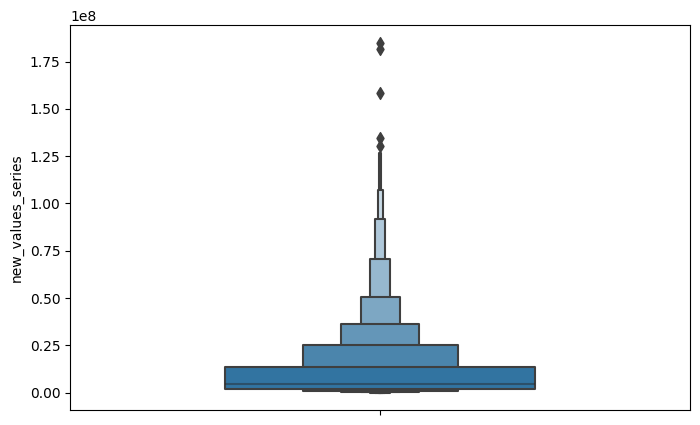

In [ ]:
plt.figure(figsize=(8,5))
sns.boxenplot(y='new_values_series', data=df_players, width=0.5)
plt.show()

<ipython-input-17-5615a360c7c8>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x).set_title('Frequency Distribution Plot of Player Actual Values')


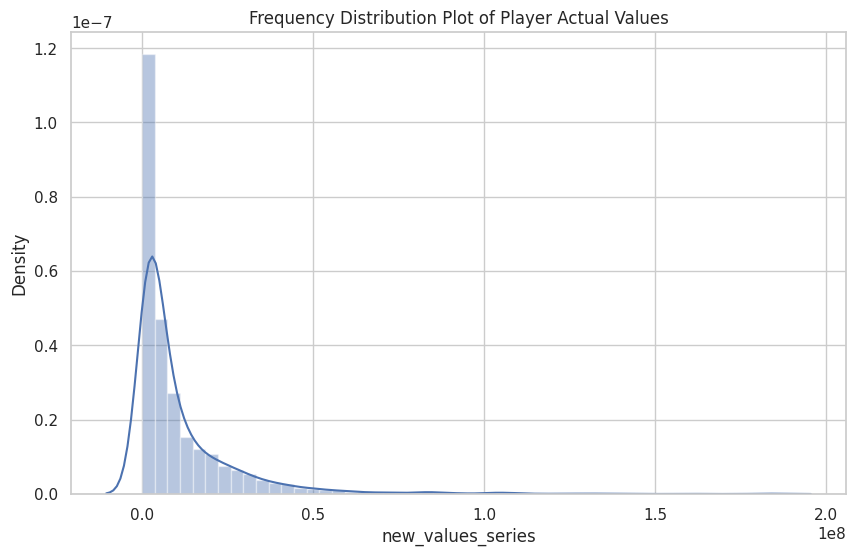

In [ ]:
x = df_players.new_values_series
sns.set(style="whitegrid")
plt.figure(figsize=(10,6))
sns.distplot(x).set_title('Frequency Distribution Plot of Player Actual Values')
plt.show()

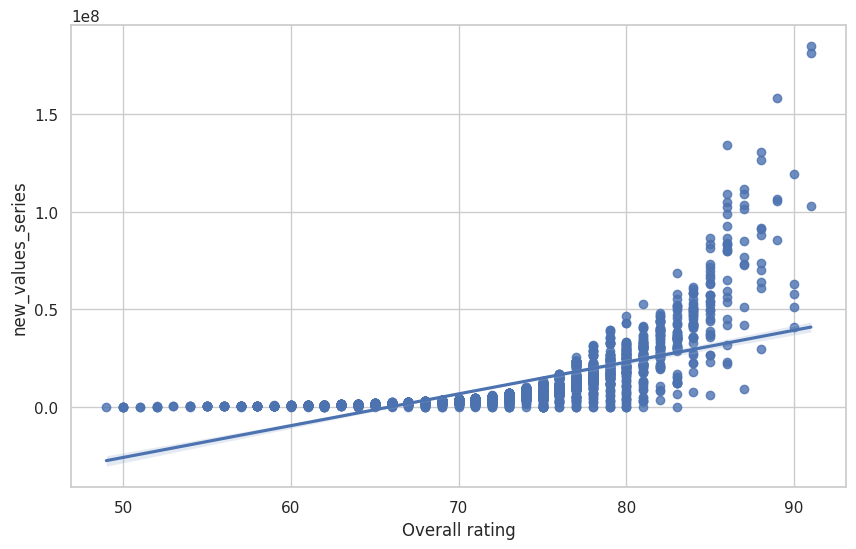

In [ ]:
plt.figure(figsize=(10,6))
sns.regplot(x="Overall rating",y="new_values_series",data=df_players)
plt.show()

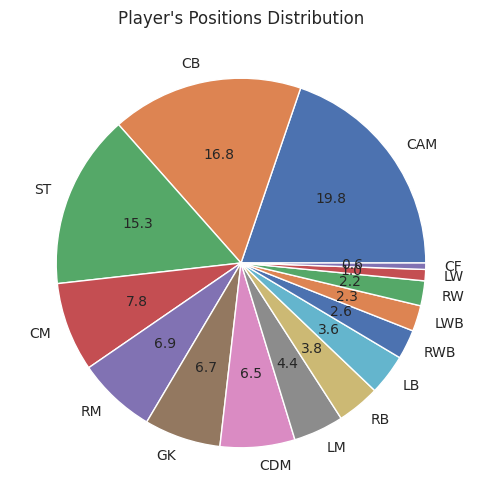

In [ ]:
plt.figure(figsize=(9,6))
loc=df_players['Best position'].value_counts()
loc.plot(kind='pie' ,autopct='%.1f',fontsize=10,subplots=True)
plt.title("Player's Positions Distribution")
plt.ylabel("")
plt.show()

<Figure size 2000x2000 with 0 Axes>

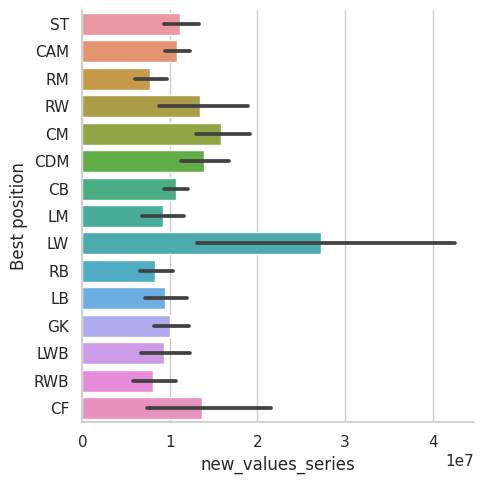

In [ ]:
plt.figure(figsize=(10,10),dpi=200)
graph = sns.catplot(y="Best position", x="new_values_series", kind="bar",  data=df_players)
plt.show()

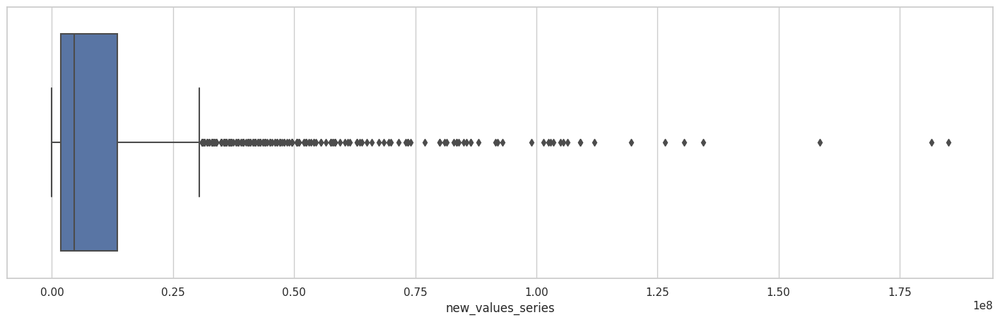

In [ ]:
plt.figure(figsize=[18,5])
sns.boxplot(x=df_players['new_values_series'], data=df_players);

In [ ]:
df_players = df_players.drop(['ID'], axis=1)

In [ ]:
correlation_matrix = df_players.corr()

<ipython-input-23-8da9fac111a6>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df_players.corr()


In [ ]:
correlation_with_target = correlation_matrix['new_values_series']

In [ ]:
correlation_with_target

Age                          0.175067
Overall rating               0.685998
Potential                    0.609753
Height                       0.020666
Weight                       0.053903
Best overall                 0.695938
Growth                      -0.312429
Total attacking              0.315210
Crossing                     0.250554
Finishing                    0.251203
Heading accuracy             0.189992
Short passing                0.392773
Volleys                      0.259201
Total skill                  0.316341
Dribbling                    0.265339
Curve                        0.268019
FK Accuracy                  0.228418
Long passing                 0.368841
Ball control                 0.323080
Total movement               0.290153
Acceleration                 0.165548
Sprint speed                 0.182140
Agility                      0.187610
Reactions                    0.630179
Balance                      0.134407
Total power                  0.388103
Shot power  

In [ ]:
sorted_correlation = correlation_with_target.sort_values(ascending=False)

# Create a list of tuples with variable name and correlation value pairs
sorted_correlation_list = [(variable, correlation) for variable, correlation in sorted_correlation.items()]

# Display the sorted correlation values and names
print("Sorted correlation values and names:")
for variable, correlation in sorted_correlation_list:
    print(f"{variable}: {correlation}")

Sorted correlation values and names:
new_values_series: 1.0
new_release_clause_series: 0.9747077640522752
new_wages_series: 0.8027066930559035
Best overall: 0.6959382942679063
Overall rating: 0.6859984195949437
Reactions: 0.6301786870141378
Potential: 0.6097525674661131
International reputation: 0.595018157495434
Base stats: 0.5708281850172966
Dribbling / Reflexes: 0.4919889966360535
Passing / Kicking: 0.4840394502151947
Composure: 0.4780160960721501
Total stats: 0.4321045883615757
Vision: 0.40334098675327323
Short passing: 0.39277333404576537
Total power: 0.3881033026680242
Long passing: 0.36884083905848297
Shot power: 0.35251394972232003
Total mentality: 0.336878836848134
Shooting / Handling: 0.3366469872944597
Ball control: 0.32308012361556093
Total skill: 0.31634137276602403
Total attacking: 0.3152101813705398
Jumping: 0.3002194593865971
Stamina: 0.2984798279542451
Total movement: 0.29015311114343767
Curve: 0.26801882767055907
Dribbling: 0.2653386532019403
Long shots: 0.26124846174

In [ ]:
df_players.to_csv('newdf.csv', index=False)

In [ ]:
import statsmodels.api as sm
import patsy
import scipy.stats as stats
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNet, ElasticNetCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [ ]:
df = pd.read_csv('/content/newdf.csv')


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2524 entries, 0 to 2523
Data columns (total 63 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   name                       2524 non-null   object 
 1   Age                        2524 non-null   int64  
 2   Overall rating             2524 non-null   int64  
 3   Potential                  2524 non-null   int64  
 4   Height                     2524 non-null   int64  
 5   Weight                     2524 non-null   int64  
 6   foot                       2524 non-null   object 
 7   Best overall               2524 non-null   int64  
 8   Best position              2524 non-null   object 
 9   Growth                     2524 non-null   int64  
 10  Total attacking            2524 non-null   int64  
 11  Crossing                   2524 non-null   int64  
 12  Finishing                  2524 non-null   int64  
 13  Heading accuracy           2524 non-null   int64

In [ ]:
df.head()

,name,Age,Overall rating,Potential,Height,Weight,foot,Best overall,Best position,Growth,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,new_values_series,Team,new_wages_series,new_release_clause_series
0,E. Højlund ST,18,56,76,185,79,Right,58,ST,20,252,34,56,58,55,49,243,54,38,46,48,57,295,65,60,58,48,64,307,57,70,58,72,50,230,49,24,54,48,55,52,73,25,24,24,48,11,12,12,5,8,1448,311,1,62,55,47,55,28,400000.0,København,2000.0,920000.0
1,R. Højlund ST,20,77,89,191,79,Left,79,ST,12,324,38,78,70,70,68,306,75,58,48,49,76,380,84,86,69,75,66,396,78,88,75,85,70,314,80,28,78,58,70,72,74,27,28,19,50,12,8,9,14,7,1844,404,1,85,76,56,74,31,25500000.0,Manchester United,77000.0,53600000.0
2,T. Kubo RW ST CAM,22,81,87,173,64,Left,83,CAM,6,352,77,81,49,78,67,390,83,75,74,74,84,415,89,79,85,79,83,349,73,69,74,59,74,289,43,28,79,76,63,72,129,40,43,46,48,6,7,15,10,10,1972,419,3,84,76,76,83,40,41500000.0,Real Sociedad,40000.0,95500000.0
3,O. Højlund CM CDM,18,60,76,184,71,Right,63,RM,16,268,52,48,54,64,50,283,61,53,48,60,61,355,74,72,78,59,72,296,54,66,68,60,48,286,68,58,59,56,45,59,174,58,57,59,46,9,10,6,8,13,1708,365,1,73,50,58,63,57,625000.0,København,1000.0,1200000.0
4,Carlos Forbs RW LW,19,72,86,169,58,Left,72,RW,14,316,65,72,53,64,62,312,73,65,54,53,67,420,92,88,85,68,87,315,66,69,65,52,63,299,58,42,70,63,66,69,88,31,33,24,36,5,8,12,5,6,1786,385,1,90,68,62,73,35,5500000.0,Ajax,8000.0,11100000.0


In [ ]:
df.sort_values(by='new_values_series').tail(20)

,name,Age,Overall rating,Potential,Height,Weight,foot,Best overall,Best position,Growth,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,new_values_series,Team,new_wages_series,new_release_clause_series
211,Bruno Fernandes CAM CM RW,28,88,88,179,69,Right,88,CAM,0,413,87,83,66,90,87,432,81,86,85,92,88,390,74,68,78,91,79,410,88,73,95,66,88,422,84,66,88,94,90,82,208,69,74,65,63,12,14,15,8,14,2338,476,4,71,86,90,83,69,92000000.0,Manchester United,260000.0,174800000.0
43,R. Araujo CB RB,24,86,91,188,79,Right,88,CB,5,313,58,56,85,76,38,281,55,47,45,66,68,357,76,86,56,84,55,354,68,92,72,87,35,330,87,85,56,59,43,76,258,86,86,86,53,11,14,9,11,8,1946,432,3,82,53,65,62,86,93000000.0,FC Barcelona,175000.0,197600000.0
11,B. Saka RW RM,21,86,90,178,65,Left,86,RW,4,373,83,84,45,82,79,397,89,82,69,69,88,427,88,82,85,85,87,380,79,70,86,63,82,378,68,62,82,84,82,81,182,60,62,60,50,7,8,13,9,13,2187,465,2,85,82,80,88,60,99000000.0,Arsenal,150000.0,190600000.0
120,L. Martínez ST,25,87,89,174,72,Right,88,ST,2,400,58,90,86,75,91,375,84,78,54,73,86,423,83,77,86,88,89,420,85,93,80,84,78,377,90,45,90,78,74,86,130,55,31,44,48,11,8,8,8,13,2173,455,3,80,86,71,85,48,101500000.0,Inter,150000.0,180200000.0
57,Rafael Leão LW CF ST,24,86,91,188,81,Right,86,LW,5,381,78,84,65,80,74,379,89,80,60,63,87,435,93,93,85,84,80,396,80,85,77,80,74,306,60,24,84,75,63,83,67,22,24,21,57,10,12,15,11,9,2021,438,2,93,80,75,87,27,102500000.0,Milan,110000.0,181900000.0
194,K. De Bruyne CM CAM,32,91,91,181,75,Right,91,CM,0,412,95,85,55,94,83,447,86,92,83,94,92,388,72,72,74,92,78,418,92,72,88,74,92,407,75,66,88,95,83,88,189,66,70,53,56,15,13,5,10,13,2317,484,5,72,88,94,87,65,103000000.0,Manchester City,350000.0,190600000.0
244,F. de Jong CM CDM,26,87,90,181,74,Right,89,CM,3,383,78,72,72,91,70,413,87,84,64,89,89,417,80,83,87,88,79,379,68,82,89,74,66,374,74,82,77,88,53,90,229,76,76,77,49,7,13,10,10,9,2244,479,4,82,69,86,87,77,103500000.0,FC Barcelona,240000.0,219900000.0
139,Pedri CM,20,86,92,174,60,Right,88,CM,6,334,68,72,50,88,56,402,87,79,62,86,88,422,81,76,88,87,90,369,68,73,87,73,68,355,62,73,79,88,53,87,210,68,77,65,46,12,7,11,8,8,2138,461,3,78,69,82,88,70,105000000.0,FC Barcelona,165000.0,236300000.0
127,Rodri CDM CM,27,89,90,191,82,Right,89,CDM,1,356,63,64,81,89,59,383,79,65,61,90,88,334,54,62,65,89,64,425,91,80,89,83,82,386,83,84,75,82,62,85,253,88,87,78,49,10,10,7,14,8,2186,460,4,58,73,80,80,85,105500000.0,Manchester City,250000.0,203100000.0
179,Rúben Dias CB,26,89,90,187,82,Right,89,CB,1,285,54,29,87,83,32,309,64,46,48,76,75,328,54,69,60,89,56,352,74,84,78,90,26,314,93,86,39,51,45,81,269,91,91,87,47,7,8,13,7,12,1904,412,4,62,39,66,69,89,106500000.0,Manchester City,250000.0,205000000.0


In [ ]:
df.loc[527].values #just looking a random player


array(['T. Mitchell LB', 23, 76, 81, 175, 66, 'Left', 76, 'LB', 5, 257,
       69, 36, 53, 63, 36, 282, 68, 52, 39, 53, 70, 377, 76, 75, 76, 76,
       74, 284, 40, 69, 74, 63, 38, 315, 74, 78, 59, 59, 45, 61, 235, 77,
       80, 78, 57, 9, 12, 14, 8, 14, 1807, 388, 1, 75, 39, 60, 70, 76,
       10500000.0, 'Crystal Palace', 29000.0, 20700000.0], dtype=object)

In [ ]:
df = df[df['new_values_series']!=1000]


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2524 entries, 0 to 2523
Data columns (total 63 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   name                       2524 non-null   object 
 1   Age                        2524 non-null   int64  
 2   Overall rating             2524 non-null   int64  
 3   Potential                  2524 non-null   int64  
 4   Height                     2524 non-null   int64  
 5   Weight                     2524 non-null   int64  
 6   foot                       2524 non-null   object 
 7   Best overall               2524 non-null   int64  
 8   Best position              2524 non-null   object 
 9   Growth                     2524 non-null   int64  
 10  Total attacking            2524 non-null   int64  
 11  Crossing                   2524 non-null   int64  
 12  Finishing                  2524 non-null   int64  
 13  Heading accuracy           2524 non-null   int64

In [ ]:
df = pd.get_dummies(df,columns=['foot'],drop_first=True)


In [ ]:
df.drop(['Growth','new_wages_series', 'new_release_clause_series','Crossing','Short passing','Volleys','Dribbling','Curve','FK Accuracy','Long passing','Acceleration','Sprint speed','Agility','Reactions','Balance','Jumping','Stamina','Long shots','Aggression','Interceptions','Penalties','Composure','Total defending','Marking','Standing tackle','Sliding tackle','Total goalkeeping','Base stats',
         'Best overall','Total attacking','Heading accuracy','Positioning','Vision','Strength','Total skill','Best position','Team','Total stats'
        ],axis=1,inplace=True)

In [ ]:
df.sort_values(by='new_values_series')


,name,Age,Overall rating,Potential,Height,Weight,Finishing,Ball control,Total movement,Total power,Shot power,Total mentality,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,new_values_series,foot_Right
470,A. Afif LM CF CAM,26,76,76,176,70,74,75,395,326,70,282,7,14,8,5,10,1,87,72,71,77,32,0.0,1
1673,13 D. Beckham CM RM,37,78,78,182,75,62,83,318,372,79,367,10,12,7,15,7,3,58,71,85,71,52,0.0,1
1677,20 B. Schweinsteiger CB,34,75,75,183,79,65,79,263,348,73,370,14,14,13,13,11,4,34,69,77,71,72,0.0,1
1678,18 Kaká CAM CF,35,80,80,186,83,74,83,332,319,76,332,3,5,5,3,3,3,62,76,79,78,30,0.0,1
1688,23 H. Moreno CB,34,77,77,186,75,43,68,304,316,64,323,12,15,14,9,10,1,55,49,64,61,77,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,F. Valverde CM RW,24,88,92,182,78,79,88,409,425,89,395,6,10,6,15,8,3,88,82,84,84,80,130500000.0,1
23,J. Musiala CAM CM LM,20,86,93,184,72,79,89,441,344,73,342,6,9,8,8,11,3,85,75,76,91,63,134500000.0,1
47,Vini Jr. LW,22,89,94,176,73,89,90,454,378,76,317,5,7,7,7,10,5,95,82,78,90,29,158500000.0,1
33,K. Mbappé ST LW,24,91,94,182,75,94,92,462,426,90,362,13,5,7,11,6,5,97,90,80,92,36,181500000.0,1


In [ ]:
corr_matrix = df.corr()
corr_matrix

<ipython-input-39-208d05607fc1>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


,Age,Overall rating,Potential,Height,Weight,Finishing,Ball control,Total movement,Total power,Shot power,Total mentality,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,new_values_series,foot_Right
Age,1.000000,0.604027,-0.185158,0.069665,0.226226,0.156489,0.168857,-0.005341,0.389172,0.414986,0.331250,0.135598,0.138897,0.129288,0.147467,0.130482,0.578294,-0.134270,0.385149,0.522922,0.372592,0.235964,0.175067,0.011914
Overall rating,0.604027,1.000000,0.547474,0.044499,0.144067,0.288359,0.414490,0.301216,0.583447,0.532809,0.492112,0.068714,0.073074,0.071828,0.076785,0.068874,0.625632,0.197073,0.484952,0.741194,0.695239,0.346102,0.685998,-0.005692
Potential,-0.185158,0.547474,1.000000,0.038297,-0.008662,0.134266,0.258129,0.242302,0.211625,0.185452,0.190246,0.011709,0.017216,0.022852,0.013035,0.011736,0.323641,0.248860,0.192223,0.343166,0.418116,0.134141,0.609753,-0.007442
Height,0.069665,0.044499,0.038297,1.000000,0.759272,-0.379978,-0.392072,-0.640922,-0.034506,-0.167041,-0.285751,0.331911,0.337165,0.322347,0.325656,0.326583,0.041180,-0.322242,-0.140622,-0.191407,-0.311673,0.129664,0.020666,0.070298
Weight,0.226226,0.144067,-0.008662,0.759272,1.000000,-0.273094,-0.297489,-0.513044,0.097437,-0.022000,-0.181346,0.294934,0.296401,0.284012,0.289693,0.292053,0.157128,-0.270201,-0.031726,-0.095336,-0.203066,0.114455,0.053903,0.093433
Finishing,0.156489,0.288359,0.134266,-0.379978,-0.273094,1.000000,0.777919,0.665979,0.706728,0.750301,0.671763,-0.578219,-0.574412,-0.565571,-0.570272,-0.574774,0.220376,0.235728,0.645389,0.343269,0.476906,-0.267691,0.251203,0.008315
Ball control,0.168857,0.414490,0.258129,-0.392072,-0.297489,0.777919,1.000000,0.728981,0.736742,0.588655,0.881098,-0.790751,-0.787055,-0.775298,-0.783561,-0.789336,0.262507,0.118520,0.232811,0.369745,0.401779,0.193679,0.323080,-0.069692
Total movement,-0.005341,0.301216,0.242302,-0.640922,-0.513044,0.665979,0.728981,1.000000,0.517529,0.439604,0.593822,-0.558418,-0.561025,-0.546648,-0.554938,-0.553451,0.126843,0.668578,0.275949,0.292928,0.502395,-0.033178,0.290153,-0.084212
Total power,0.389172,0.583447,0.211625,-0.034506,0.097437,0.706728,0.736742,0.517529,1.000000,0.780830,0.806293,-0.514999,-0.511292,-0.509605,-0.511330,-0.516115,0.340879,0.132687,0.448096,0.406582,0.381227,0.228103,0.388103,0.011270
Shot power,0.414986,0.532809,0.185452,-0.167041,-0.022000,0.750301,0.588655,0.439604,0.780830,1.000000,0.593524,-0.250860,-0.246161,-0.237296,-0.244325,-0.250050,0.396361,0.161422,0.772834,0.577818,0.595538,-0.100083,0.352514,0.007546


Text(0.5, 1.0, 'Correlation Heatmap')

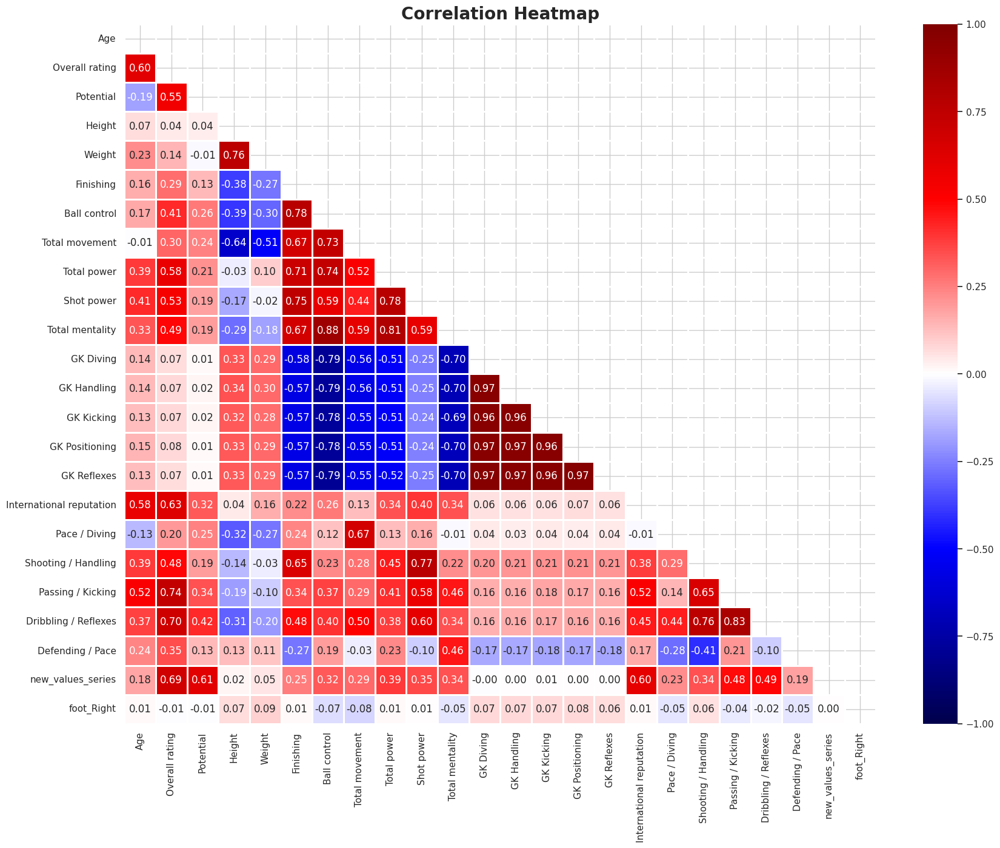

In [ ]:
fig = plt.figure(figsize=[20,15])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)
#plt.savefig('heatmap1.png',transparent=True, bbox_inches='tight')

In [ ]:
df = df.drop(['Height','Weight','foot_Right'],axis=1)

#['Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing']

<ipython-input-107-62a8909dd92a>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


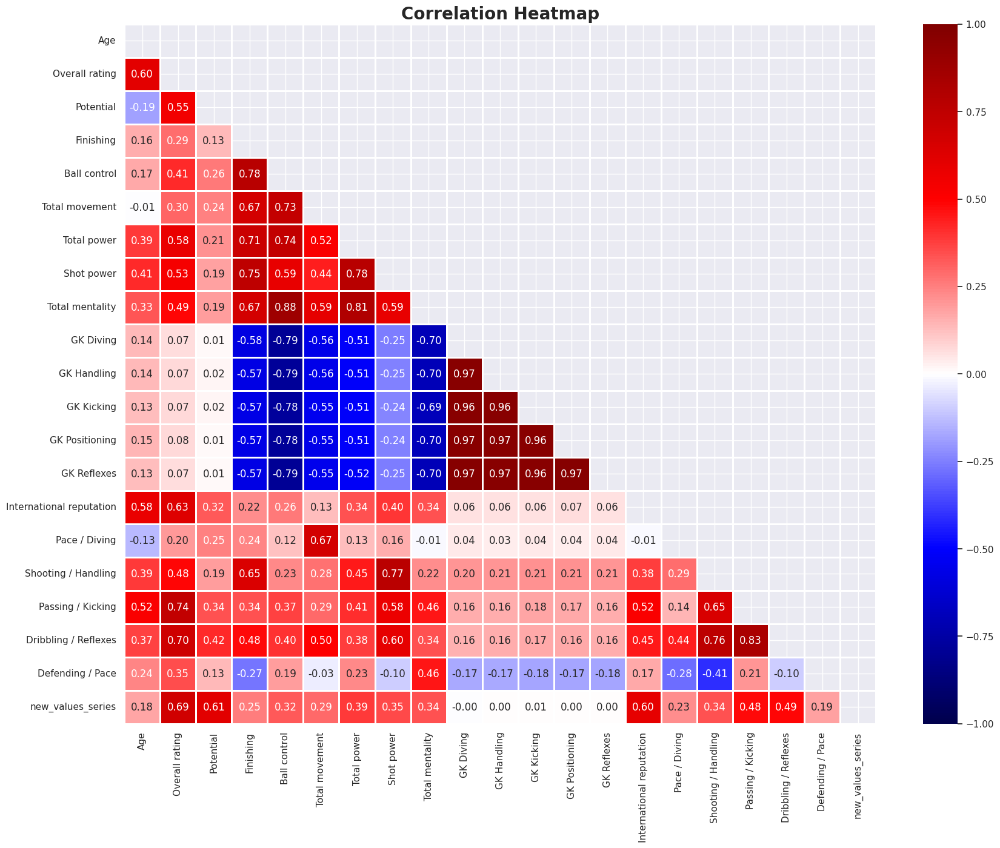

In [ ]:
corr_matrix = df.corr()
fig = plt.figure(figsize=[20,15])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)
plt.savefig('heatmap2.png',transparent=True, bbox_inches='tight')

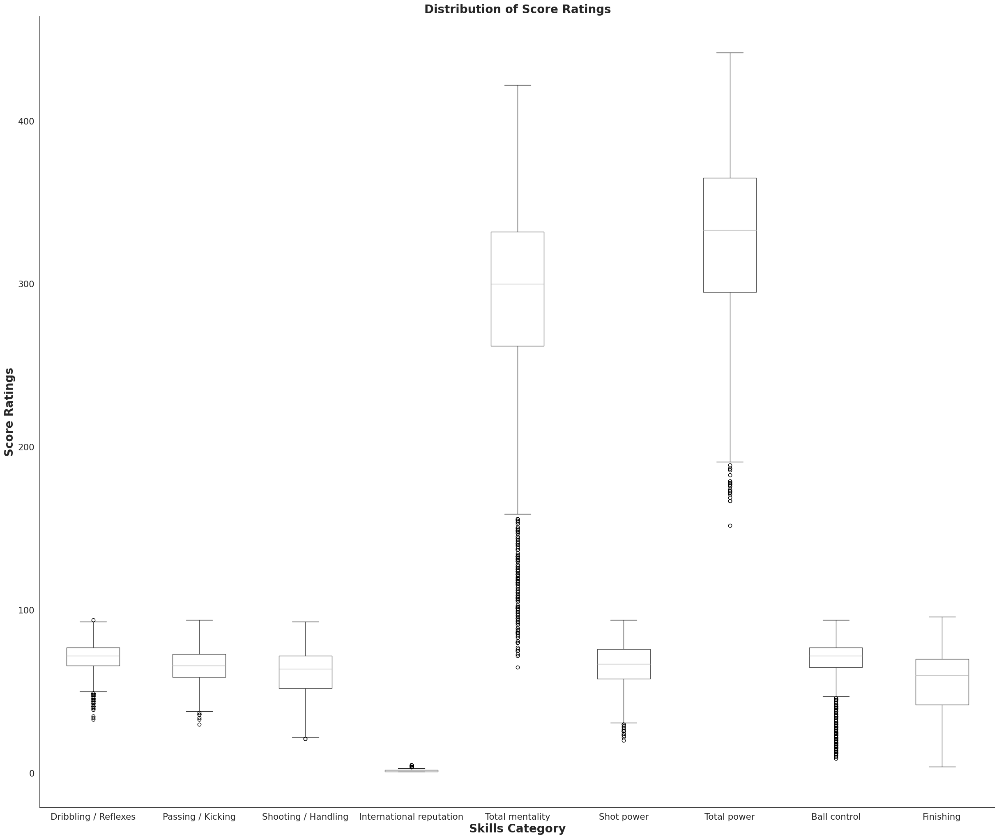

In [ ]:
fig = plt.figure(figsize=[30,25])
sns.set(style='white', font_scale=1.4)
df[['Dribbling / Reflexes','Passing / Kicking','Shooting / Handling','International reputation','Total mentality','Shot power','Total power','Ball control','Finishing']].boxplot()
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings', fontsize=20, weight='bold')
sns.despine()
# plt.savefig('boxplot.png', transparent=True, bbox_inches='tight')

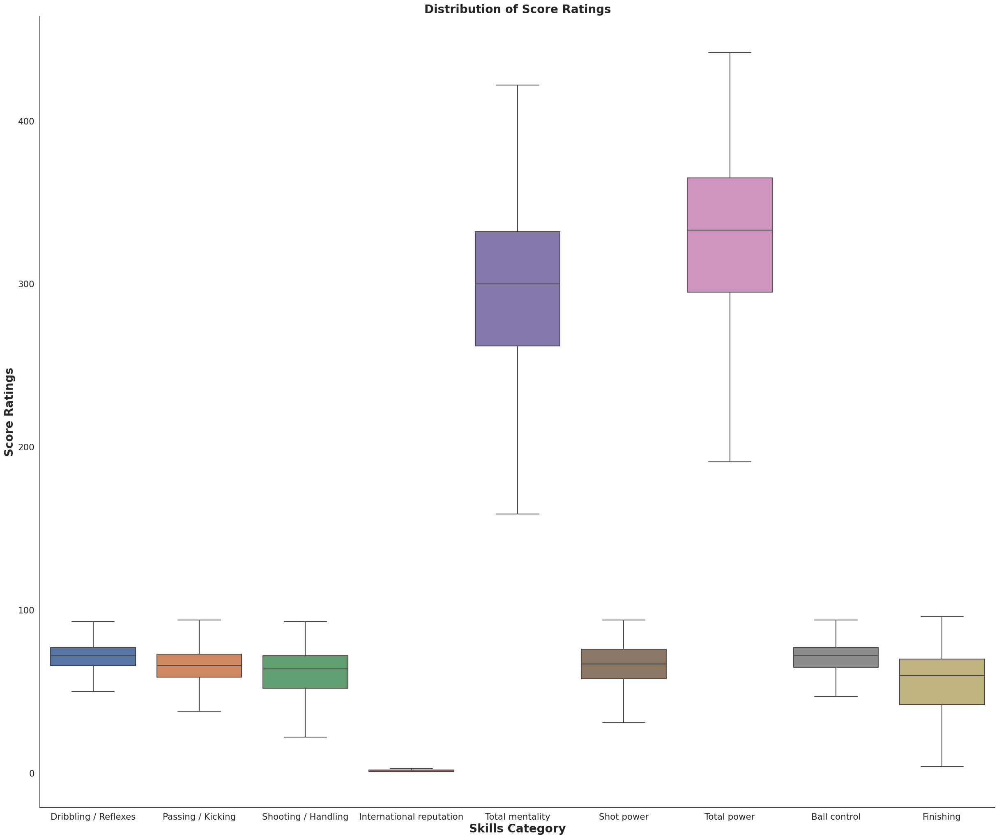

In [ ]:
fig = plt.figure(figsize=[30,25])
sns.set(style='white', font_scale=1.4)
data = df[['Dribbling / Reflexes','Passing / Kicking','Shooting / Handling','International reputation','Total mentality','Shot power','Total power','Ball control','Finishing']]
sns.boxplot(data=data, showfliers=False)
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings', fontsize=20, weight='bold')
sns.despine()
# plt.savefig('boxplot.png', transparent=True, bbox_inches='tight')

<ipython-input-47-25f82908c1e4>:4: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q1 = df.quantile(0.25)
<ipython-input-47-25f82908c1e4>:5: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q3 = df.quantile(0.75)
<ipython-input-47-25f82908c1e4>:13: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  filtered_df = df[~((df < lower_bound) | (df > upper_bound)).any(axis=1)]


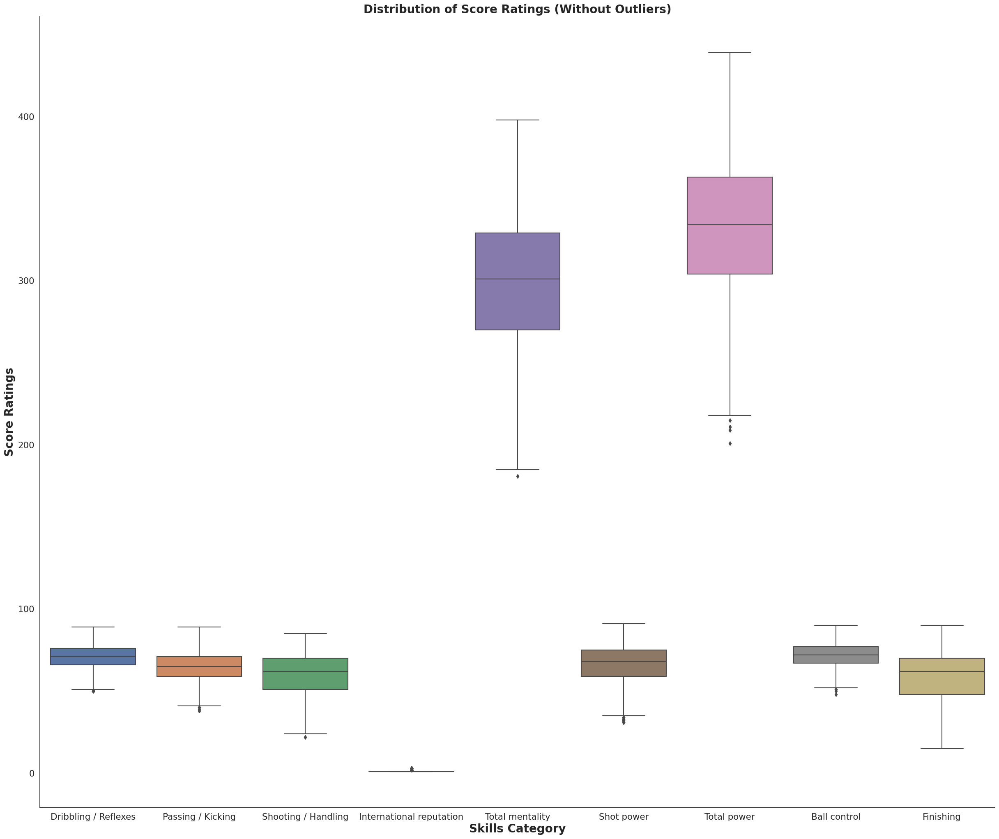

In [ ]:
import numpy as np

# Calculate the IQR for each column
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Define the upper and lower bounds to identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out the outliers from the dataset
filtered_df = df[~((df < lower_bound) | (df > upper_bound)).any(axis=1)]

# Create the boxplot with the filtered dataset
fig = plt.figure(figsize=[30,25])
sns.set(style='white', font_scale=1.4)
data = filtered_df[['Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing']]
sns.boxplot(data=data)
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings (Without Outliers)', fontsize=20, weight='bold')
sns.despine()

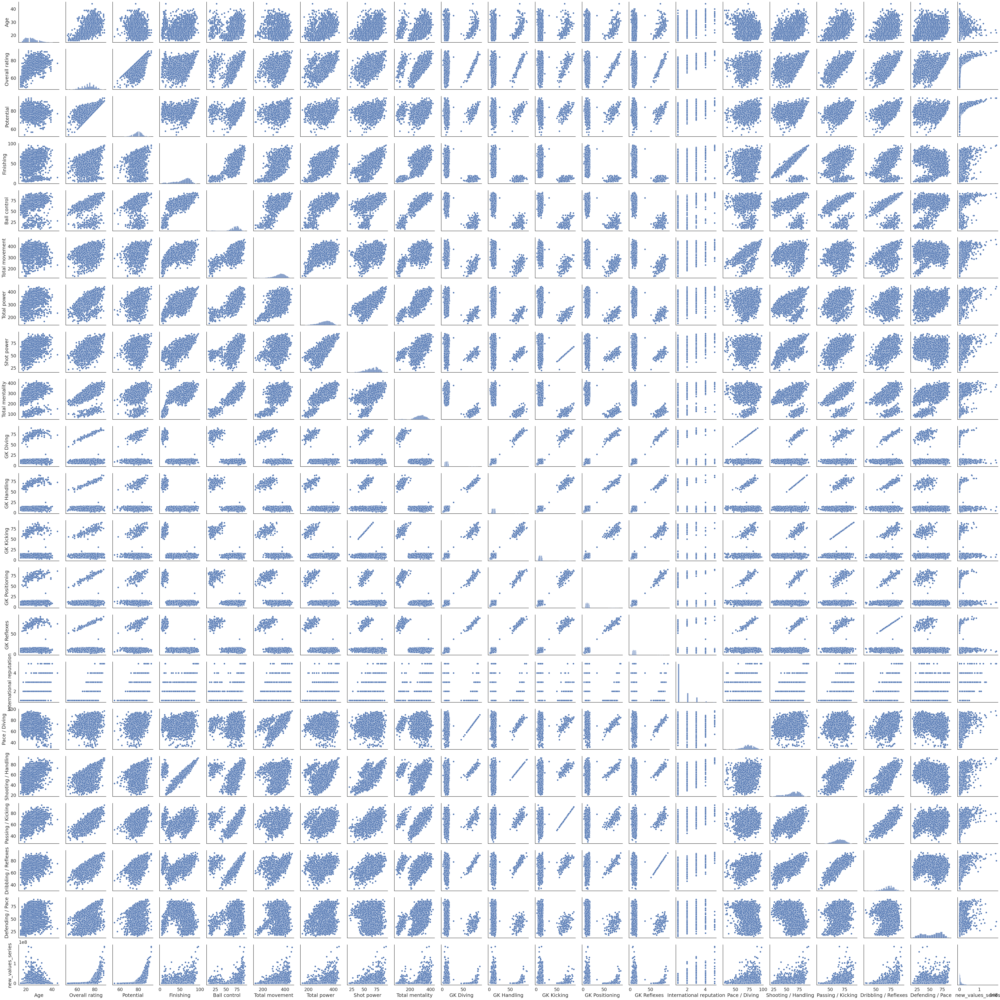

In [ ]:
sns.set(style='white',font_scale=1.5)
sns.pairplot(df)
#plt.savefig('pairplot1.png',transparent=True, bbox_inches='tight')

In [ ]:
selected_columns = ['name','Age','Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing','new_values_series']
new_df = df[selected_columns].copy()

In [ ]:
new_df


,name,Age,Dribbling / Reflexes,Passing / Kicking,Shooting / Handling,International reputation,Total mentality,Shot power,Total power,Ball control,Finishing,new_values_series
0,E. Højlund ST,18,55,47,55,1,230,57,307,57,56,400000.0
1,R. Højlund ST,20,74,56,76,1,314,78,396,76,78,25500000.0
2,T. Kubo RW ST CAM,22,83,76,76,3,289,73,349,84,81,41500000.0
3,O. Højlund CM CDM,18,63,58,50,1,286,54,296,61,48,625000.0
4,Carlos Forbs RW LW,19,73,62,68,1,299,66,315,67,72,5500000.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2519,Javi Llabrés LM RM,21,68,58,59,1,241,59,280,65,62,1900000.0
2520,M. Leonard CM CDM,21,63,60,51,1,308,58,311,65,47,1600000.0
2521,T. Fukui CM CAM,18,63,58,44,1,257,48,211,63,42,525000.0
2522,I. Koné CM,21,69,61,58,1,284,66,340,72,55,2500000.0


In [ ]:
y, X = patsy.dmatrices("Q('new_values_series') ~ Q('Age') + Q('Dribbling / Reflexes') + Q('Passing / Kicking') + Q('Shooting / Handling') + Q('International reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=new_df, return_type="dataframe")
model = sm.OLS(y, X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                              
==================================================================================
Dep. Variable:     Q('new_values_series')   R-squared:                       0.557
Model:                                OLS   Adj. R-squared:                  0.555
Method:                     Least Squares   F-statistic:                     316.0
Date:                    Wed, 25 Oct 2023   Prob (F-statistic):               0.00
Time:                            20:53:10   Log-Likelihood:                -44536.
No. Observations:                    2524   AIC:                         8.909e+04
Df Residuals:                        2513   BIC:                         8.916e+04
Df Model:                              10                                         
Covariance Type:                nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                     -4.837e+07   2.47e+06    -19.592      0.000   -5.32e+07   -4.35e+07
Q('Age')                      -1.524e+06    6.7e+04    -22.754      0.000   -1.65e+06   -1.39e+06
Q('Dribbling / Reflexes')      4.366e+05   7.03e+04      6.211      0.000    2.99e+05    5.75e+05
Q('Passing / Kicking')         2.866e+05    6.1e+04      4.699      0.000    1.67e+05    4.06e+05
Q('Shooting / Handling')       8.113e+04   8.39e+04      0.967      0.333   -8.33e+04    2.46e+05
Q('International reputation')  1.273e+07   3.73e+05     34.159      0.000     1.2e+07    1.35e+07
Q('Total mentality')          -2.376e+04   1.13e+04     -2.111      0.035   -4.58e+04   -1684.822
Q('Shot power')               -2.867e+05   4.82e+04     -5.944      0.000   -3.81e+05   -1.92e+05
Q('Total power')               1.649e+05   1.02e+04     16.169      0.000    1.45e+05    1.85e+05
Q('Ball control')              7.406e+04   6.54e+04      1.132      0.258   -5.42e+04    2.02e+05
Q('Finishing')                -1.774e+05   5.14e+04     -3.451      0.001   -2.78e+05   -7.66e+04
==============================================================================
Omnibus:                     1591.725   Durbin-Watson:                   1.595
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            33993.936
Skew:                           2.611   Prob(JB):                         0.00
Kurtosis:                      20.204   Cond. No.                     5.25e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.25e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
df1 = new_df.copy()


In [ ]:
mask = new_df['new_values_series'] > 0  # Create a boolean mask for non-zero values
df1['new_values_series'] = np.log(new_df.loc[mask, 'new_values_series'])  # Apply log only to non-zero values

In [ ]:
df1 = df1.rename(columns={'new_values_series':'Log Market Value'})


<ipython-input-55-0ddef4ff367e>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df1.corr()


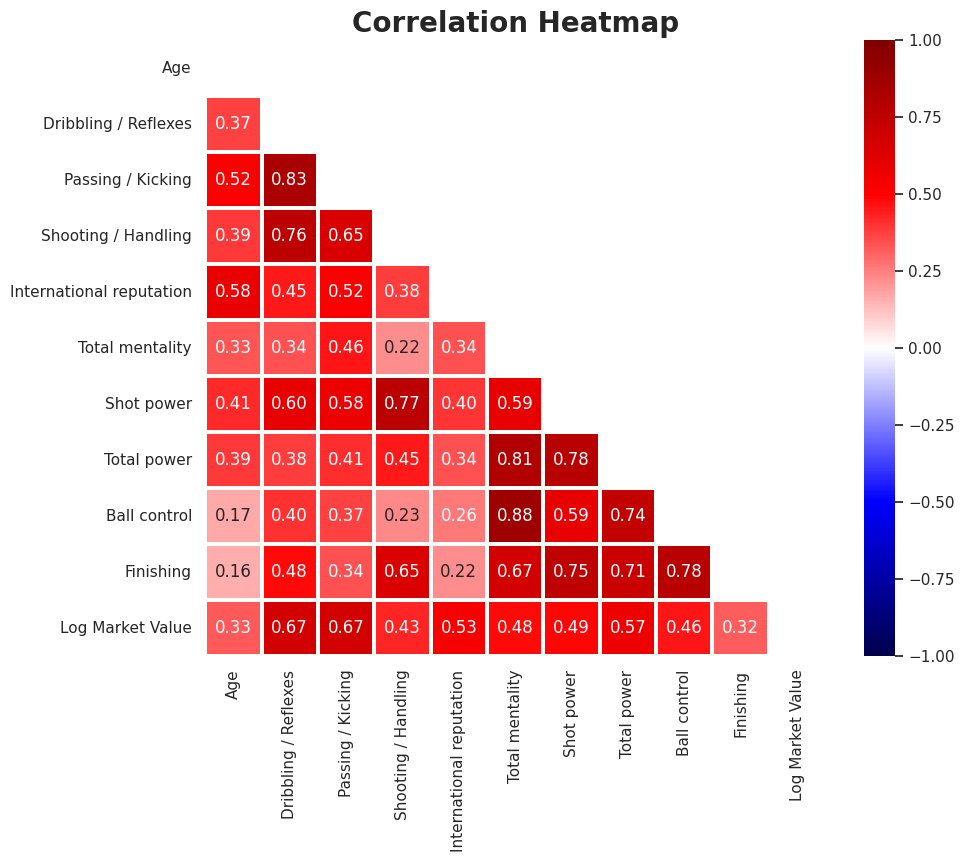

In [ ]:

sns.set(font_scale=1,style='white')
corr_matrix = df1.corr()
fig = plt.figure(figsize=[10,8])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1.5,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)
plt.savefig('heatmap3.png',transparent=True, bbox_inches='tight')

In [ ]:
y, X = patsy.dmatrices("Q('Log Market Value') ~ Q('Age') + Q('Dribbling / Reflexes') + Q('Passing / Kicking') + Q('Shooting / Handling') + Q('International reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=df1, return_type="dataframe")

model = sm.OLS(y, X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Q('Log Market Value')   R-squared:                       0.722
Model:                               OLS   Adj. R-squared:                  0.721
Method:                    Least Squares   F-statistic:                     639.3
Date:                   Wed, 25 Oct 2023   Prob (F-statistic):               0.00
Time:                           21:32:20   Log-Likelihood:                -2588.3
No. Observations:                   2476   AIC:                             5199.
Df Residuals:                       2465   BIC:                             5263.
Df Model:                             10                                         
Covariance Type:               nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                         6.1950      0.154     40.199      0.000       5.893       6.497
Q('Age')                         -0.0676      0.004    -16.099      0.000      -0.076      -0.059
Q('Dribbling / Reflexes')         0.0589      0.004     13.410      0.000       0.050       0.067
Q('Passing / Kicking')            0.0265      0.004      6.993      0.000       0.019       0.034
Q('Shooting / Handling')          0.0171      0.005      3.276      0.001       0.007       0.027
Q('International reputation')     0.4180      0.023     17.892      0.000       0.372       0.464
Q('Total mentality')             -0.0026      0.001     -3.751      0.000      -0.004      -0.001
Q('Shot power')                  -0.0281      0.003     -9.390      0.000      -0.034      -0.022
Q('Total power')                  0.0183      0.001     28.764      0.000       0.017       0.020
Q('Ball control')                 0.0286      0.004      7.009      0.000       0.021       0.037
Q('Finishing')                   -0.0358      0.003    -11.158      0.000      -0.042      -0.030
==============================================================================
Omnibus:                       32.736   Durbin-Watson:                   1.680
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               44.207
Skew:                           0.169   Prob(JB):                     2.52e-10
Kurtosis:                       3.561   Cond. No.                     5.25e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.25e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
def diagnostic_plot(x, y):
    plt.figure(figsize=(20,5))

    rgr = LinearRegression()
    rgr.fit(x,y)
    pred = rgr.predict(x)

    plt.subplot(1, 3, 1)
    plt.scatter(pred,y,alpha=0.1)
    plt.plot(y, y, color='red',linewidth=1,)
    plt.title("Regression fit")
    plt.xlabel("Predicted y")
    plt.ylabel("y")

    plt.subplot(1, 3, 2)
    res = y - pred
    plt.scatter(pred, res,alpha=0.1)
    plt.title("Residual plot")
    plt.xlabel("prediction")
    plt.ylabel("residuals")

    print(res)

    plt.subplot(1, 3, 3)
    #Generates a probability plot of sample data against the quantiles of a
    # specified theoretical distribution
    stats.probplot(res, dist="norm", plot=plt,)
    plt.title("Normal Q-Q plot")

In [ ]:
y = df1['Log Market Value']
X = df1.drop(['name','Log Market Value'],axis=1)

In [ ]:
y

0       12.899220
1       17.054189
2       17.541204
3       13.345507
4       15.520259
          ...    
2519    14.457364
2520    14.285514
2521    13.171154
2522    14.731801
2523    14.603968
Name: Log Market Value, Length: 2524, dtype: float64

0      -0.949487
1       1.053864
2       0.311065
3      -1.317332
4       0.634886
          ...   
2519    0.250927
2520   -0.498666
2521   -0.352436
2522   -0.833597
2523    0.246972
Name: Log Market Value, Length: 2476, dtype: float64


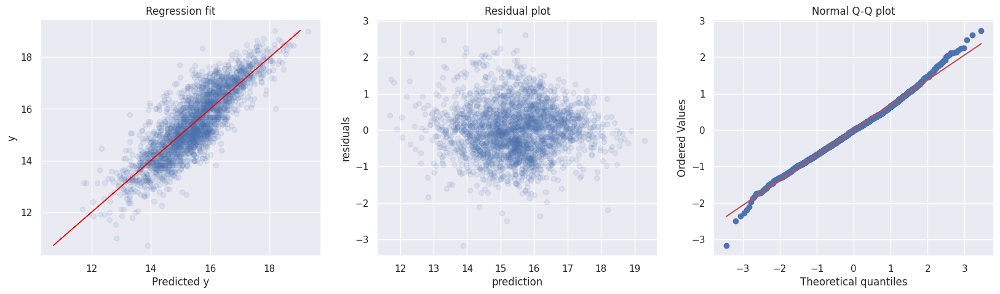

In [ ]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer

# Remove rows with missing values from X and y
combined_df = pd.concat([X, y], axis=1)
combined_df.dropna(inplace=True)

# Separate X and y after removing missing values
X = combined_df.iloc[:, :-1]
y = combined_df.iloc[:, -1]

# Use the diagnostic_plot() function with the updated X and y
sns.set(style='darkgrid')
diagnostic_plot(X, y)

In [ ]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2,random_state=42)
selected_columns2 = ['Age','Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Shot power', 'Total power', 'Ball control', 'Finishing']


In [ ]:
from sklearn.linear_model import LinearRegression


In [ ]:
df1.isna().sum()


name                         0
Age                          0
Dribbling / Reflexes         0
Passing / Kicking            0
Shooting / Handling          0
International reputation     0
Total mentality              0
Shot power                   0
Total power                  0
Ball control                 0
Finishing                    0
Log Market Value            48
dtype: int64

In [ ]:
df1 = df1.dropna()


In [ ]:
df1.isna().sum()


name                        0
Age                         0
Dribbling / Reflexes        0
Passing / Kicking           0
Shooting / Handling         0
International reputation    0
Total mentality             0
Shot power                  0
Total power                 0
Ball control                0
Finishing                   0
Log Market Value            0
dtype: int64

In [ ]:
X_train = df1.drop(['name', 'Log Market Value'], axis=1)
y_train = df1['Log Market Value']
reg = LinearRegression()
reg.fit(X_train, y_train)

LinearRegression()

In [ ]:
model = reg.fit(X,y)

In [ ]:
model.intercept_


6.194991499876544

In [ ]:
model.coef_


array([-0.06760712,  0.05885504,  0.02653503,  0.01714139,  0.41800148,
       -0.00263056, -0.02814783,  0.01827965,  0.0285964 , -0.03583396])

In [ ]:
reg.score(X_train, y_train)


0.7217053467728917

In [ ]:
from sklearn.ensemble import RandomForestRegressor


In [ ]:
forest = RandomForestRegressor()

forest.fit(X_train, y_train)

RandomForestRegressor()

In [ ]:
forest.score(X_train, y_train)


0.9784119013886325

In [ ]:
forest.predict(X_test)


array([14.93455147, 17.51131867, 15.17798281, 14.0854702 , 18.28067073,
       14.48749735, 17.21627957, 14.86149171, 16.67274935, 14.74281265,
       16.70209398, 14.28551572, 17.51752331, 14.88901147, 18.30220061,
       14.05027076, 14.03043007, 17.12934456, 16.10213163, 15.20561781,
       14.1819017 , 14.37341186, 15.42988434, 15.88287235, 15.00923811,
       12.63767098, 15.55802006, 16.71233059, 14.94594491, 16.77427896,
       14.88227329, 15.83370716, 13.62316894, 14.74159666, 15.29509085,
       17.77535863, 14.86552252, 16.89200074, 15.75032483, 13.73473726,
       15.44436334, 15.58335847, 14.8147903 , 16.03391257, 15.07730699,
       14.01725652, 14.94130748, 17.37478712, 14.98416117, 14.67592514,
       14.11844037, 14.8600797 , 15.73897018, 15.86042988, 16.78469846,
       15.01305149, 14.82483721, 15.83896389, 17.29452028, 17.38134751,
       16.17989079, 17.79782829, 15.3956281 , 17.24332866, 13.20625155,
       15.56226647, 15.06115324, 15.92878158, 15.22254554, 16.22

In [ ]:

np.array([y_test
         ])

array([[14.88022129, 17.73748389, 14.91412285, 14.22097567, 18.44537336,
        14.5574479 , 17.19990082, 14.6909793 , 16.58809928, 14.97866137,
        16.70588232, 13.81551056, 17.52908262, 14.88022129, 18.45508217,
        13.91082074, 13.99783211, 17.03438638, 15.95557672, 15.31958795,
        14.40329722, 13.81551056, 15.42494847, 15.68731273, 14.97866137,
        12.52452638, 15.8949521 , 16.88356349, 14.73180129, 16.860033  ,
        15.03928599, 15.95557672, 13.65299163, 14.80876233, 15.40474576,
        17.88453731, 15.03928599, 16.92902587, 15.42494847, 13.26212532,
        15.20180492, 15.60727003, 14.73180129, 16.21340583, 14.97866137,
        14.07787482, 14.88022129, 17.45309672, 14.94691267, 14.6909793 ,
        13.91082074, 14.84512998, 15.76142071, 16.25785759, 16.88356349,
        15.34156686, 14.771022  , 16.06680236, 17.45309672, 17.3990295 ,
        16.11809565, 17.8044946 , 15.31958795, 17.28124646, 13.07107008,
        15.60727003, 15.06827353, 16.06680236, 15.2

In [ ]:
X_test.head()


,Age,Dribbling / Reflexes,Passing / Kicking,Shooting / Handling,International reputation,Total mentality,Shot power,Total power,Ball control,Finishing
1771,22,73,61,67,1,258,70,339,72,66
251,25,86,82,76,3,341,79,346,86,74
1593,29,74,69,75,1,331,83,399,74,69
440,17,69,51,52,1,242,58,246,66,56
57,24,87,75,80,2,306,80,396,87,84


In [ ]:
# Assuming you have trained your model and obtained predictions on the testing dataset
predictions_forest = forest.predict(X_test)
predictions_reg = reg.predict(X_test)
# Create a new DataFrame for predictions and actual values
results_df = pd.DataFrame({'Predicted Market Value (Random Forest)': predictions_forest,
                           'Predicted Market Value (Linear Regression)': predictions_reg,
                           'Actual Market Value': y_test})

In [ ]:
results_df.head()


,Predicted Market Value (Random Forest),Predicted Market Value (Linear Regression),Actual Market Value
1771,14.934551,15.430834,14.880221
251,17.511319,17.310608,17.737484
1593,15.177983,15.854368,14.914123
440,14.085470,13.877595,14.220976
57,18.280671,17.550051,18.445373


In [ ]:
from sklearn import metrics


In [ ]:
mean_sq_err_forest = metrics.mean_squared_error(y_test, predictions_forest)


In [ ]:
RMSE_forest = np.sqrt(mean_sq_err_forest)


In [ ]:
mean_sq_err_reg = metrics.mean_squared_error(y_test, predictions_reg)


In [ ]:
RMSE_reg = np.sqrt(mean_sq_err_reg)
RMSE_reg

0.6536979576506707

In [ ]:
RMSE_forest


0.17716224739558467

In [ ]:
X_train = df1.drop(['name', 'Log Market Value'], axis=1)
y_train = df1['Log Market Value']
forest.fit(X_train, y_train)

RandomForestRegressor()

In [ ]:
forest.score(X_train, y_train)

0.9784798105294331

In [ ]:

forest.predict(X_train)

array([13.05198974, 16.77916473, 17.55106595, ..., 13.27545026,
       14.80123122, 14.56796224])

In [ ]:
predictions_forest_train = forest.predict(X_train)

results_df_train = pd.DataFrame({'Predicted Market Value (Random Forest)': predictions_forest_train,

                           'Actual Market Value': y_train})

In [ ]:
results_df_train

,Predicted Market Value (Random Forest),Actual Market Value
0,13.051990,12.899220
1,16.779165,17.054189
2,17.551066,17.541204
3,13.514093,13.345507
4,15.237245,15.520259
...,...,...
2519,14.285479,14.457364
2520,14.407462,14.285514
2521,13.275450,13.171154
2522,14.801231,14.731801


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

# Create a Random Forest regressor
rf = RandomForestRegressor()

# Perform cross-validation
rf_score = cross_val_score(rf, X, y, cv=10, scoring='r2').mean()

In [ ]:
rf_score


0.6882729515310048

In [ ]:
rf.fit(X,y)

RandomForestRegressor()

In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# X_train: Training features
# y_train: Training labels
# X_val: Validation features
# y_val: Validation labels

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Create a Random Forest regressor
rf = RandomForestRegressor()

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='r2', cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Access the best model
best_model = grid_search.best_estimator_

# Evaluate the best model
best_model_score = best_model.score(X_val, y_val)
print("Best Model Score:", best_model_score)

# Make predictions using the best model
predictions = best_model.predict(X_test)

Best Model Score: 0.8599691052877012


In [ ]:
from sklearn.metrics import mean_squared_error

# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Evaluate the predictions using mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.22557409094664027


In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Evaluate the predictions using mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Evaluate the predictions using R^2 score
r2 = r2_score(y_test, y_pred)
print("R^2 Score:", r2)

Mean Squared Error: 0.22557409094664027
R^2 Score: 0.8599691052877012


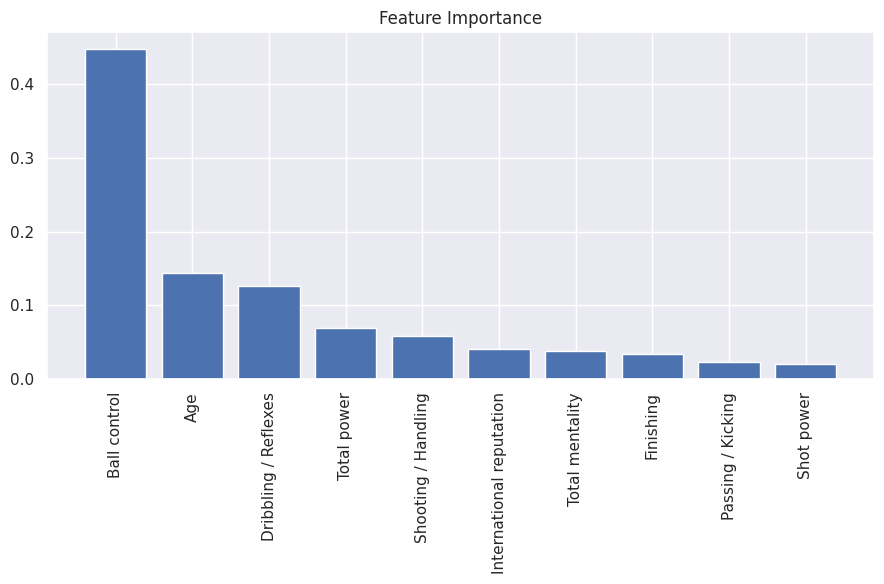

In [ ]:
import matplotlib.pyplot as plt

# Get feature importances
importances = best_model.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Plot feature importances
plt.figure(figsize=(9, 6))
plt.title("Feature Importance")
plt.bar(range(X_train.shape[1]), importances[indices], align='center')
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.tight_layout()
plt.show()
#plt.savefig('feature_importances.png', transparent=True, bbox_inches='tight')

In [ ]:
import pandas as pd

# Create a DataFrame with real and predicted market values
results = pd.DataFrame({'Real Market Values': y_test, 'Predicted Market Values': y_pred})
print(results)

      Real Market Values  Predicted Market Values
1771           14.880221                15.039819
251            17.737484                17.339266
1593           14.914123                15.885866
440            14.220976                13.844493
57             18.445373                17.893824
...                  ...                      ...
1783           14.690979                14.590195
1886           14.346139                14.158645
2515           13.623139                14.037826
2269           15.761421                15.207410
2521           13.171154                13.481340

[496 rows x 2 columns]


In [ ]:
print(results.head(10))

      Real Market Values  Predicted Market Values
1771           14.880221                15.039819
251            17.737484                17.339266
1593           14.914123                15.885866
440            14.220976                13.844493
57             18.445373                17.893824
1537           14.557448                14.454739
1127           17.199901                17.367833
2022           14.690979                15.300765
1327           16.588099                16.891603
2367           14.978661                14.331512


In [ ]:

index_value = 1000
feature_values = df1.loc[index_value]

for column_name, value in feature_values.iteritems():
    print(f"{column_name}: {value}")

name: C. Uzun CAM ST
Age: 17
Dribbling / Reflexes: 70
Passing / Kicking: 58
Shooting / Handling: 64
International reputation: 1
Total mentality: 238
Shot power: 66
Total power: 300
Ball control: 70
Finishing: 66
Log Market Value: 14.403297222866392


<ipython-input-103-1d3f229b5efe>:4: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column_name, value in feature_values.iteritems():


In [ ]:
input_features = [
    {'Ball control': 90,
     'Dribbling / Reflexes': 88,
     'Total power': 400,
    'Shooting / Handling': 88,
     'Age': 26,
     'Total mentality': 354,
    'Finishing': 74,
     'Passing / Kicking': 77,
     'Shot power': 84,
     'International reputation': 2}
]

In [ ]:
input_data = pd.DataFrame(input_features)


input_array = input_data.values

predictions = best_model.predict(input_array)
print(f"predicted market value is (in million $) {predictions}")

predicted market value is (in million $) [16.36249925]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


# Player Value Prediction - Kaggle Dataset

In [ ]:
df_kaggle  = pd.read_csv('/content/players_data.csv')
df_kaggle_2  = pd.read_csv('/content/footballData 2.csv')


In [ ]:
df_kaggle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3120 entries, 0 to 3119
Data columns (total 64 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   name                      3120 non-null   object
 1   Age                       3120 non-null   int64 
 2   Overall rating            3120 non-null   int64 
 3   Potential                 3120 non-null   int64 
 4   Team & Contract           3120 non-null   object
 5   ID                        3120 non-null   int64 
 6   Height                    3120 non-null   object
 7   Weight                    3120 non-null   object
 8   foot                      3120 non-null   object
 9   Best overall              3120 non-null   int64 
 10  Best position             3120 non-null   object
 11  Growth                    3120 non-null   int64 
 12  Value                     3120 non-null   object
 13  Wage                      3120 non-null   object
 14  Release clause          

In [ ]:
df_kaggle_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18944 entries, 0 to 18943
Columns: 106 entries, sofifa_id to rb
dtypes: float64(18), int64(44), object(44)
memory usage: 15.3+ MB


In [ ]:
df_kaggle_2.columns.values

array(['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob',
       'height_cm', 'weight_kg', 'nationality', 'club_name',
       'league_name', 'league_rank', 'overall', 'potential', 'value_eur',
       'wage_eur', 'player_positions', 'preferred_foot',
       'international_reputation', 'weak_foot', 'skill_moves',
       'work_rate', 'body_type', 'real_face', 'release_clause_eur',
       'player_tags', 'team_position', 'team_jersey_number',
       'loaned_from', 'joined', 'contract_valid_until', 'nation_position',
       'nation_jersey_number', 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking',
       'gk_reflexes', 'gk_speed', 'gk_positioning', 'player_traits',
       'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',


In [ ]:
df_kaggle_2.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,league_rank,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,...,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33,24/06/1987,170,72,Argentina,FC Barcelona,Spain Primera Division,1.0,93,93,67500000,560000,"RW, ST, CF",Left,5,4,4,Medium/Low,Messi,Yes,138400000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...",CAM,10.0,NaN,01/07/2004,2021.0,RW,10.0,85.0,92.0,91.0,95.0,...,95,75,96,NaN,35,24,6,11,15,14,8,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,05/02/1985,187,83,Portugal,Juventus,Italian Serie A,1.0,92,92,46000000,220000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,75900000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...",LS,7.0,NaN,10/07/2018,2022.0,LS,7.0,89.0,93.0,81.0,89.0,...,82,84,95,NaN,32,24,7,11,15,14,11,91+1,91+1,91+1,89+0,91+0,91+0,91+0,89+0,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3
2,200389,https://sofifa.com/player/200389/jan-oblak/210002,J. Oblak,Jan Oblak,27,07/01/1993,188,87,Slovenia,Atlético Madrid,Spain Primera Division,1.0,91,93,75000000,125000,GK,Right,3,3,1,Medium/Medium,PLAYER_BODY_TYPE_259,Yes,159400000.0,NaN,GK,13.0,NaN,16/07/2014,2023.0,GK,1.0,NaN,NaN,NaN,NaN,...,65,11,68,NaN,12,18,87,92,78,90,90,33+3,33+3,33+3,32+0,35+0,35+0,35+0,32+0,38+3,38+3,38+3,35+3,38+3,38+3,38+3,35+3,32+3,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3
3,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,31,21/08/1988,184,80,Poland,FC Bayern München,German 1. Bundesliga,1.0,91,91,80000000,240000,ST,Right,4,4,4,High/Medium,PLAYER_BODY_TYPE_276,Yes,132000000.0,"#Distance Shooter, #Clinical Finisher",ST,9.0,NaN,01/07/2014,2023.0,NaN,NaN,78.0,91.0,78.0,85.0,...,79,88,88,NaN,42,19,15,6,12,8,10,89+2,89+2,89+2,85+0,87+0,87+0,87+0,85+0,85+3,85+3,85+3,83+3,79+3,79+3,79+3,83+3,64+3,65+3,65+3,65+3,64+3,61+3,60+3,60+3,60+3,61+3
4,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,28,05/02/1992,175,68,Brazil,Paris Saint-Germain,French Ligue 1,1.0,91,91,90000000,270000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,166500000.0,"#Speedster, #Dribbler, #Playmaker, #FK Special...",LW,10.0,NaN,03/08/2017,2022.0,NaN,NaN,91.0,85.0,86.0,94.0,...,90,92,93,NaN,30,29,9,9,15,15,11,84+3,84+3,84+3,90+0,89+0,89+0,89+0,90+0,90+1,90+1,90+1,90+1,83+3,83+3,83+3,90+1,67+3,62+3,62+3,62+3,67+3,62+3,49+3,49+3,49+3,62+3


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Load your FIFA 23 dataset
data = pd.read_csv("/content/Fifa 23 Players Data.csv")

# Select features and target variable
X = data[['Overall', 'Age', 'Best Position']]
y = data['Value(in Euro)']

# Split the dataset into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define a preprocessor to one-hot encode the "Position" column
preprocessor = ColumnTransformer(
    transformers=[
        ('pos', OneHotEncoder(), ['Best Position'])
    ],
    remainder='passthrough'
)

# Create a linear regression model in a pipeline
model = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae}")

# To predict a player's value, provide their attributes
player_attributes = pd.DataFrame({'Overall': [85], 'Age': [25], 'Position': ['ST']})
predicted_value = model.predict(player_attributes)
print(f"Predicted Value for the player: {predicted_value[0]}")

Mean Absolute Error: 3067366.019488372


KeyError: ignored

In [ ]:
data = pd.read_csv("/content/Fifa 23 Players Data.csv")
data.columns

Index(['Known As', 'Full Name', 'Overall', 'Potential', 'Value(in Euro)',
       'Positions Played', 'Best Position', 'Nationality', 'Image Link', 'Age',
       'Height(in cm)', 'Weight(in kg)', 'TotalStats', 'BaseStats',
       'Club Name', 'Wage(in Euro)', 'Release Clause', 'Club Position',
       'Contract Until', 'Club Jersey Number', 'Joined On', 'On Loan',
       'Preferred Foot', 'Weak Foot Rating', 'Skill Moves',
       'International Reputation', 'National Team Name',
       'National Team Image Link', 'National Team Position',
       'National Team Jersey Number', 'Attacking Work Rate',
       'Defensive Work Rate', 'Pace Total', 'Shooting Total', 'Passing Total',
       'Dribbling Total', 'Defending Total', 'Physicality Total', 'Crossing',
       'Finishing', 'Heading Accuracy', 'Short Passing', 'Volleys',
       'Dribbling', 'Curve', 'Freekick Accuracy', 'LongPassing', 'BallControl',
       'Acceleration', 'Sprint Speed', 'Agility', 'Reactions', 'Balance',
       'Shot Powe

<ipython-input-17-d44a03dfb241>:16: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlations = data.corr()['Value(in Euro)']


Top correlated features:
Index(['Release Clause', 'Wage(in Euro)', 'International Reputation',
       'Overall', 'Potential', 'Reactions', 'BaseStats', 'Dribbling Total',
       'Passing Total'],
      dtype='object')
Mean Squared Error: 1833327734539.7112
R-squared: 0.962900517076823


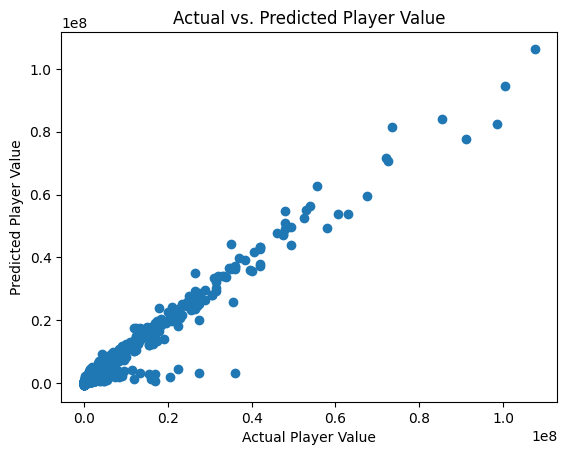

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


ValueError: ignored

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv("Fifa 23 Players Data.csv")

# # Data preprocessing (handle missing values, encode categorical variables, and select relevant features)
# # For example, let's assume we want to predict 'Value(in Euro)' based on 'Overall', 'Potential', and 'Age'.
# X = data[['Overall', 'Potential', 'Age']]  # Select relevant features
# y = data['Value(in Euro)']

# Calculate the correlation between features and the target variable
correlations = data.corr()['Value(in Euro)']

# Sort the correlations in descending order to see the most correlated features
sorted_correlations = correlations.abs().sort_values(ascending=False)

# Select the top N most correlated features
N = 9  # You can change N to select a different number of features
# selected_features = sorted_correlations[1:N+1].index  # Exclude the target variable
selected_features = sorted_correlations[1:10].index  # Exclude the target variable
print("Top correlated features:")
print(selected_features)

# Extract the selected features and the target variable
X = data[selected_features]
y = data['Value(in Euro)']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

# Optionally, visualize the results
plt.scatter(y_test, y_pred)
plt.xlabel("Actual Player Value")
plt.ylabel("Predicted Player Value")
plt.title("Actual vs. Predicted Player Value")
plt.show()

# Now, you can use the model to predict the value of a new player by providing their features as input.

# Example prediction
# Example prediction
new_player_features = [[80, 85, 25]]  # Replace with actual feature values
predicted_value = model.predict(new_player_features)
print(f"Predicted Player Value: {predicted_value}")


In [ ]:
print(X.shape)

(18539, 9)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Load the dataset
data = pd.read_csv("/content/Fifa 23 Players Data.csv")

# Calculate the correlation between features and the target variable
correlations = data.corr()['Value(in Euro)']

# Sort the correlations in descending order to see the most correlated features
sorted_correlations = correlations.abs().sort_values(ascending=False)

# Select the top 9 most correlated features
selected_features = sorted_correlations[1:10].index  # Exclude the target variable

# Extract the selected features and the target variable
X = data[selected_features]
y = data['Value(in Euro)']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")

# Now, you can use the model to predict the value of a new player by providing their features as input.

# Example prediction
new_feature1 = 80  # Replace with actual value
new_feature2 = 85  # Replace with actual value
new_feature3 = 25  # Replace with actual value
new_feature4 = 75  # Replace with actual value
new_feature5 = 70  # Replace with actual value
new_feature6 = 80  # Replace with actual value
new_feature7 = 65  # Replace with actual value
new_feature8 = 70  # Replace with actual value
new_feature9 = 75  # Replace with actual value

# new_player_features = [[new_feature1, new_feature2, new_feature3, new_feature4, new_feature5, new_feature6, new_feature7, new_feature8, new_feature9]]
# predicted_value = model.predict(new_player_features)
# print(f"Predicted Player Value: {predicted_value}")

# Example prediction with feature names
new_player_features = pd.DataFrame({
    'Release Clause': [new_feature1],
    'Wage(in Euro)': [new_feature2],
    'International Reputation': [new_feature3],
    'Overall': [new_feature4],
    'Potential': [new_feature5],
    'Reactions': [new_feature6],
    'BaseStats': [new_feature7],
    'Dribbling Total': [new_feature8],
    'Passing Total': [new_feature9]
})

predicted_value = model.predict(new_player_features)
print(f"Predicted Player Value: {predicted_value}")


<ipython-input-25-2dc6113e55f5>:11: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlations = data.corr()['Value(in Euro)']


Mean Squared Error: 1833327734539.7112
Root Mean Squared Error: 1354004.3332795177
R-squared: 0.962900517076823
Predicted Player Value: [15170104.1258228]


In [ ]:
print(selected_features)

Index(['Release Clause', 'Wage(in Euro)', 'International Reputation',
       'Overall', 'Potential', 'Reactions', 'BaseStats', 'Dribbling Total',
       'Passing Total'],
      dtype='object')


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
# Drop unnecessary columns for OLS (you can adjust this based on your dataset)
data = data.drop(['Known As', 'Full Name', 'Image Link', 'National Team Name', 'National Team Image Link'], axis=1)

# Handle categorical variables with one-hot encoding
categorical_features = ['Positions Played', 'Best Position', 'Nationality', 'Club Name', 'Club Position', 'Preferred Foot', 'Attacking Work Rate', 'Defensive Work Rate']
data = pd.get_dummies(data, columns=categorical_features, drop_first=True)

# Feature scaling for numeric features (e.g., Overall, Potential, Age)
numeric_features = ['Overall', 'Potential', 'Age', 'Value(in Euro)']
scaler = StandardScaler()
data[numeric_features] = scaler.fit_transform(data[numeric_features])

# Perform OLS regression for feature selection
X = data.drop('Value(in Euro)', axis=1)
X = sm.add_constant(X)  # Add a constant term (intercept) to the model
y = data['Value(in Euro)']

model = sm.OLS(y, X).fit()
print(model.summary())

KeyError: ignored